# <font color=' MidnightBlue'><h2 align='center'>  Football : Who is going to win ?
## <font color='MediumOrchid'><h2 align='center'>Prediction System



**Done by :   Eya Zinelabidine   |   Yosr Moalla   |   Maram Brinsi   |   Nadine Elleuch**

## <font color=' MidnightBlue'> Librairies Importation 

In [210]:
import pandas as pd
import numpy as np
from tqdm import tqdm
from sklearn import model_selection
from sklearn.metrics import accuracy_score
import warnings
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.linear_model import SGDClassifier
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
import lightgbm as lgb
import re
from sklearn.feature_selection import SelectPercentile, f_classif, SelectKBest,mutual_info_classif,chi2
import seaborn as sns
import xgboost as xgb
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from lightgbm import LGBMClassifier
from sklearn.tree import DecisionTreeClassifier


warnings.filterwarnings('ignore')

## <font color=' MidnightBlue'> Data Importation 

**Train, Test and Scores datasets**

In [64]:
train_home_team_statistics_df = pd.read_csv('train_home_team_statistics_df.csv', index_col=0)
train_away_team_statistics_df = pd.read_csv('train_away_team_statistics_df.csv', index_col=0)

train_scores = pd.read_csv('Y_train.csv', index_col=0)

train_home = train_home_team_statistics_df.iloc[:,2:]
train_away = train_away_team_statistics_df.iloc[:,2:]

train_home.columns = 'HOME_' + train_home.columns
train_away.columns = 'AWAY_' + train_away.columns

train_data =  pd.concat([train_home,train_away],join='inner',axis=1)
train_scores = train_scores.loc[train_data.index]

train_data = train_data.replace({np.inf:np.nan,-np.inf:np.nan})

In [66]:
test_home = pd.read_csv('test_home_team_statistics_df.csv', index_col=0)
test_away = pd.read_csv('test_away_team_statistics_df.csv', index_col=0)

test_home.columns = 'HOME_' + test_home.columns
test_away.columns = 'AWAY_' + test_away.columns

test_data =  pd.concat([test_home,test_away],join='inner',axis=1)

## <font color=' MidnightBlue'> Data Exploration 

**Train Data**

In [68]:
train_data.head()

,HOME_TEAM_SHOTS_TOTAL_season_sum,HOME_TEAM_SHOTS_INSIDEBOX_season_sum,HOME_TEAM_SHOTS_OFF_TARGET_season_sum,HOME_TEAM_SHOTS_ON_TARGET_season_sum,HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum,HOME_TEAM_PASSES_season_sum,HOME_TEAM_SUCCESSFUL_PASSES_season_sum,HOME_TEAM_SAVES_season_sum,HOME_TEAM_CORNERS_season_sum,HOME_TEAM_FOULS_season_sum,...,AWAY_TEAM_YELLOWCARDS_5_last_match_std,AWAY_TEAM_REDCARDS_5_last_match_std,AWAY_TEAM_OFFSIDES_5_last_match_std,AWAY_TEAM_ATTACKS_5_last_match_std,AWAY_TEAM_PENALTIES_5_last_match_std,AWAY_TEAM_SUBSTITUTIONS_5_last_match_std,AWAY_TEAM_BALL_SAFE_5_last_match_std,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_std,AWAY_TEAM_INJURIES_5_last_match_std,AWAY_TEAM_GOALS_5_last_match_std
ID,,,,,,,,,,,,,,,,,,,,,
0,3.0,2.0,5.0,2.0,1.0,2.0,2.0,5.0,3.0,6.0,...,5.0,5.0,4.0,0.0,6.0,8.0,4.0,3.0,2.0,3.0
1,6.0,8.0,3.0,6.0,5.0,8.0,7.0,10.0,6.0,8.0,...,0.0,0.0,3.0,1.0,8.0,4.0,10.0,0.0,5.0,3.0
2,4.0,2.0,5.0,2.0,8.0,1.0,1.0,2.0,2.0,7.0,...,6.0,10.0,4.0,4.0,0.0,8.0,3.0,0.0,9.0,6.0
3,7.0,5.0,5.0,6.0,6.0,9.0,9.0,2.0,2.0,0.0,...,0.0,0.0,1.0,2.0,0.0,5.0,6.0,3.0,NaN,2.0
4,3.0,3.0,2.0,3.0,4.0,4.0,3.0,4.0,4.0,7.0,...,1.0,0.0,4.0,4.0,9.0,4.0,1.0,4.0,6.0,5.0


In [69]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12303 entries, 0 to 12302
Columns: 280 entries, HOME_TEAM_SHOTS_TOTAL_season_sum to AWAY_TEAM_GOALS_5_last_match_std
dtypes: float64(280)
memory usage: 26.6 MB


=> we can observe that all the features are numerical

In [71]:
print("Number of data points:", train_data.shape[0])
print("Number of features:", train_data.shape[1])

Number of data points: 12303
Number of features: 280


In [72]:
train_data.describe()

,HOME_TEAM_SHOTS_TOTAL_season_sum,HOME_TEAM_SHOTS_INSIDEBOX_season_sum,HOME_TEAM_SHOTS_OFF_TARGET_season_sum,HOME_TEAM_SHOTS_ON_TARGET_season_sum,HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum,HOME_TEAM_PASSES_season_sum,HOME_TEAM_SUCCESSFUL_PASSES_season_sum,HOME_TEAM_SAVES_season_sum,HOME_TEAM_CORNERS_season_sum,HOME_TEAM_FOULS_season_sum,...,AWAY_TEAM_YELLOWCARDS_5_last_match_std,AWAY_TEAM_REDCARDS_5_last_match_std,AWAY_TEAM_OFFSIDES_5_last_match_std,AWAY_TEAM_ATTACKS_5_last_match_std,AWAY_TEAM_PENALTIES_5_last_match_std,AWAY_TEAM_SUBSTITUTIONS_5_last_match_std,AWAY_TEAM_BALL_SAFE_5_last_match_std,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_std,AWAY_TEAM_INJURIES_5_last_match_std,AWAY_TEAM_GOALS_5_last_match_std
count,12043.000000,10918.000000,12303.000000,12301.000000,10916.000000,10890.000000,10919.000000,11523.000000,12302.000000,11546.000000,...,12302.000000,12240.000000,11298.000000,12303.000000,12290.000000,12212.000000,10467.000000,12303.000000,8990.000000,12301.000000
mean,4.391182,4.299872,4.511339,4.150882,4.524643,4.350597,4.130049,4.674043,4.505284,5.135718,...,3.906438,2.805474,3.600195,3.936032,3.701302,3.271536,3.804911,3.758026,3.886207,3.687342
std,2.871062,2.928012,2.806821,2.861291,2.845130,2.908079,2.900489,2.871876,2.802689,2.839771,...,2.823153,3.774745,2.831322,2.823259,3.696370,3.335124,2.863371,2.814694,2.795961,2.856081
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,3.000000,...,2.000000,0.000000,1.000000,2.000000,0.000000,0.000000,2.000000,2.000000,2.000000,2.000000
50%,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,...,4.000000,0.000000,3.000000,4.000000,5.000000,3.000000,3.000000,3.000000,3.000000,3.000000
75%,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,7.000000,6.000000,7.000000,...,6.000000,6.000000,5.000000,6.000000,7.000000,6.000000,6.000000,6.000000,6.000000,6.000000
max,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000


In [73]:
for col in train_data.columns:
    print(col)

HOME_TEAM_SHOTS_TOTAL_season_sum
HOME_TEAM_SHOTS_INSIDEBOX_season_sum
HOME_TEAM_SHOTS_OFF_TARGET_season_sum
HOME_TEAM_SHOTS_ON_TARGET_season_sum
HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum
HOME_TEAM_PASSES_season_sum
HOME_TEAM_SUCCESSFUL_PASSES_season_sum
HOME_TEAM_SAVES_season_sum
HOME_TEAM_CORNERS_season_sum
HOME_TEAM_FOULS_season_sum
HOME_TEAM_YELLOWCARDS_season_sum
HOME_TEAM_REDCARDS_season_sum
HOME_TEAM_OFFSIDES_season_sum
HOME_TEAM_ATTACKS_season_sum
HOME_TEAM_PENALTIES_season_sum
HOME_TEAM_SUBSTITUTIONS_season_sum
HOME_TEAM_BALL_SAFE_season_sum
HOME_TEAM_DANGEROUS_ATTACKS_season_sum
HOME_TEAM_INJURIES_season_sum
HOME_TEAM_GOALS_season_sum
HOME_TEAM_GAME_WON_season_sum
HOME_TEAM_GAME_DRAW_season_sum
HOME_TEAM_GAME_LOST_season_sum
HOME_TEAM_SHOTS_TOTAL_season_average
HOME_TEAM_SHOTS_INSIDEBOX_season_average
HOME_TEAM_SHOTS_OFF_TARGET_season_average
HOME_TEAM_SHOTS_ON_TARGET_season_average
HOME_TEAM_SHOTS_OUTSIDEBOX_season_average
HOME_TEAM_PASSES_season_average
HOME_TEAM_SUCCESSFUL_PASS

**Test Data**

In [75]:
test_data.head()

,HOME_TEAM_SHOTS_TOTAL_season_sum,HOME_TEAM_SHOTS_INSIDEBOX_season_sum,HOME_TEAM_SHOTS_OFF_TARGET_season_sum,HOME_TEAM_SHOTS_ON_TARGET_season_sum,HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum,HOME_TEAM_PASSES_season_sum,HOME_TEAM_SUCCESSFUL_PASSES_season_sum,HOME_TEAM_SAVES_season_sum,HOME_TEAM_CORNERS_season_sum,HOME_TEAM_FOULS_season_sum,...,AWAY_TEAM_YELLOWCARDS_5_last_match_std,AWAY_TEAM_REDCARDS_5_last_match_std,AWAY_TEAM_OFFSIDES_5_last_match_std,AWAY_TEAM_ATTACKS_5_last_match_std,AWAY_TEAM_PENALTIES_5_last_match_std,AWAY_TEAM_SUBSTITUTIONS_5_last_match_std,AWAY_TEAM_BALL_SAFE_5_last_match_std,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_std,AWAY_TEAM_INJURIES_5_last_match_std,AWAY_TEAM_GOALS_5_last_match_std
ID,,,,,,,,,,,,,,,,,,,,,
12303,3.0,6.0,5.0,1.0,3.0,9.0,8.0,10.0,6.0,7.0,...,6.0,0.0,1.0,4.0,0.0,8.0,7.0,2.0,7.0,0.0
12304,3.0,2.0,4.0,2.0,6.0,1.0,1.0,2.0,4.0,10.0,...,0.0,0.0,3.0,6.0,8.0,5.0,1.0,1.0,7.0,9.0
12305,7.0,10.0,8.0,8.0,1.0,4.0,5.0,0.0,10.0,4.0,...,10.0,0.0,0.0,2.0,0.0,4.0,2.0,3.0,NaN,9.0
12306,5.0,7.0,5.0,9.0,5.0,7.0,6.0,3.0,5.0,8.0,...,1.0,5.0,4.0,5.0,10.0,9.0,6.0,9.0,7.0,3.0
12307,5.0,4.0,6.0,3.0,5.0,0.0,0.0,2.0,2.0,9.0,...,3.0,0.0,6.0,5.0,0.0,4.0,3.0,10.0,3.0,1.0


In [76]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25368 entries, 12303 to 37670
Columns: 280 entries, HOME_TEAM_SHOTS_TOTAL_season_sum to AWAY_TEAM_GOALS_5_last_match_std
dtypes: float64(280)
memory usage: 55.4 MB


In [77]:
test_data.describe()

,HOME_TEAM_SHOTS_TOTAL_season_sum,HOME_TEAM_SHOTS_INSIDEBOX_season_sum,HOME_TEAM_SHOTS_OFF_TARGET_season_sum,HOME_TEAM_SHOTS_ON_TARGET_season_sum,HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum,HOME_TEAM_PASSES_season_sum,HOME_TEAM_SUCCESSFUL_PASSES_season_sum,HOME_TEAM_SAVES_season_sum,HOME_TEAM_CORNERS_season_sum,HOME_TEAM_FOULS_season_sum,...,AWAY_TEAM_YELLOWCARDS_5_last_match_std,AWAY_TEAM_REDCARDS_5_last_match_std,AWAY_TEAM_OFFSIDES_5_last_match_std,AWAY_TEAM_ATTACKS_5_last_match_std,AWAY_TEAM_PENALTIES_5_last_match_std,AWAY_TEAM_SUBSTITUTIONS_5_last_match_std,AWAY_TEAM_BALL_SAFE_5_last_match_std,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_std,AWAY_TEAM_INJURIES_5_last_match_std,AWAY_TEAM_GOALS_5_last_match_std
count,25124.000000,24442.000000,25366.000000,25365.000000,24438.000000,24253.000000,24444.000000,25003.000000,25366.000000,25086.000000,...,25361.000000,25222.000000,24517.000000,25300.000000,25173.000000,25017.000000,22478.000000,25300.000000,21692.000000,25357.000000
mean,4.568699,4.482653,4.671884,4.414626,4.527539,4.459572,4.254377,4.617086,4.634392,4.928924,...,4.001420,3.087622,3.688461,3.906047,3.686172,3.767398,3.655263,3.808972,3.764890,3.767204
std,2.884297,2.902273,2.830546,2.893270,2.923595,2.867530,2.867802,2.873614,2.848202,2.863601,...,2.852125,3.849722,2.859853,2.877801,3.694822,3.194935,2.895256,2.842463,2.850354,2.913018
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,...,2.000000,0.000000,1.000000,2.000000,0.000000,0.000000,1.000000,2.000000,2.000000,2.000000
50%,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,...,4.000000,0.000000,3.000000,4.000000,4.000000,4.000000,3.000000,3.000000,3.000000,3.000000
75%,7.000000,7.000000,7.000000,6.000000,7.000000,6.000000,6.000000,7.000000,7.000000,7.000000,...,6.000000,7.000000,5.000000,6.000000,7.000000,6.000000,6.000000,6.000000,6.000000,6.000000
max,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000


### <font color='MediumOrchid'> 1. Missing values

**Train data**

In [78]:
train_data.isnull().sum()

HOME_TEAM_SHOTS_TOTAL_season_sum                 260
HOME_TEAM_SHOTS_INSIDEBOX_season_sum            1385
HOME_TEAM_SHOTS_OFF_TARGET_season_sum              0
HOME_TEAM_SHOTS_ON_TARGET_season_sum               2
HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum           1387
                                                ... 
AWAY_TEAM_SUBSTITUTIONS_5_last_match_std          91
AWAY_TEAM_BALL_SAFE_5_last_match_std            1836
AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_std       0
AWAY_TEAM_INJURIES_5_last_match_std             3313
AWAY_TEAM_GOALS_5_last_match_std                   2
Length: 280, dtype: int64

<Axes: ylabel='ID'>

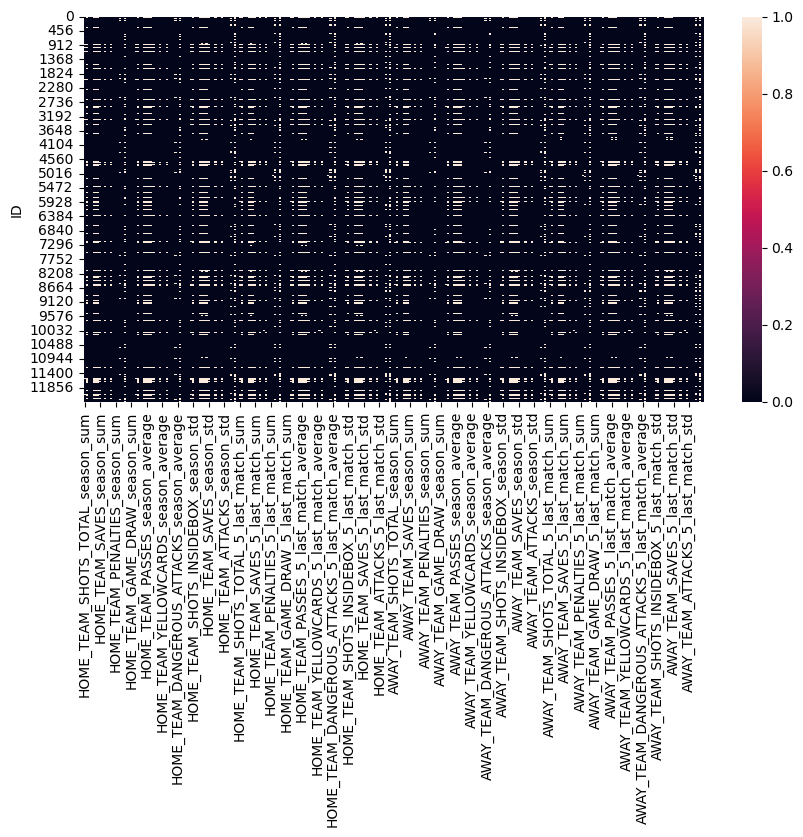

In [80]:
plt.figure(figsize=(10,5))
sns.heatmap(train_data.isnull())

**Test Data**

In [82]:
test_data.isnull().sum()

HOME_TEAM_SHOTS_TOTAL_season_sum                 244
HOME_TEAM_SHOTS_INSIDEBOX_season_sum             926
HOME_TEAM_SHOTS_OFF_TARGET_season_sum              2
HOME_TEAM_SHOTS_ON_TARGET_season_sum               3
HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum            930
                                                ... 
AWAY_TEAM_SUBSTITUTIONS_5_last_match_std         351
AWAY_TEAM_BALL_SAFE_5_last_match_std            2890
AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_std      68
AWAY_TEAM_INJURIES_5_last_match_std             3676
AWAY_TEAM_GOALS_5_last_match_std                  11
Length: 280, dtype: int64

<Axes: ylabel='ID'>

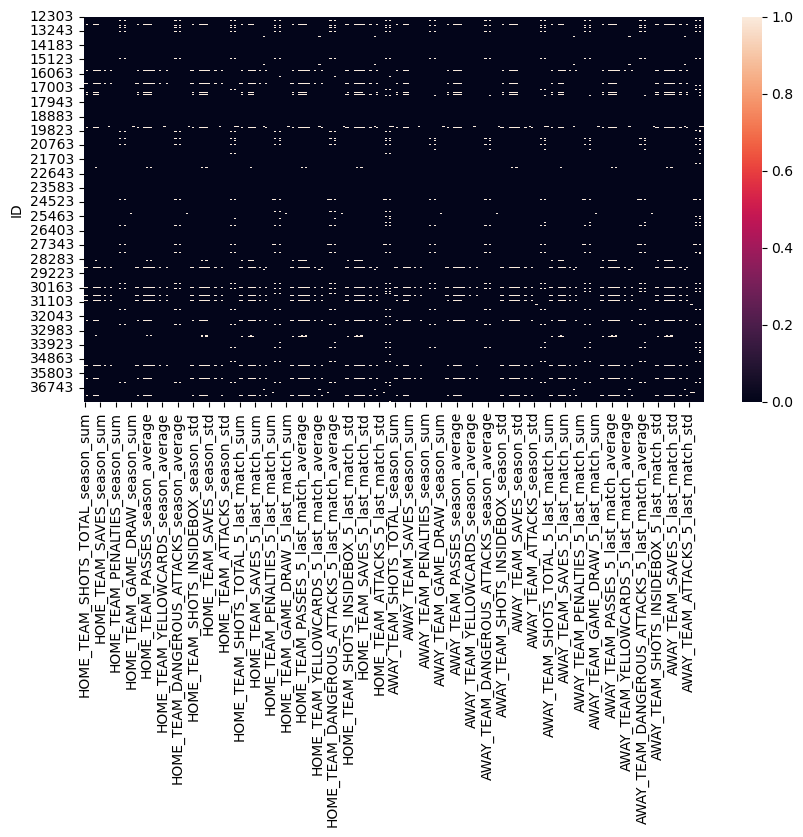

In [83]:
plt.figure(figsize=(10,5))
sns.heatmap(test_data.isnull())

### <font color='MediumOrchid'> 2. Duplicates

**Train Data**

In [86]:
train_data.duplicated().any()

False

**Test Data**

In [87]:
test_data.duplicated().any()

False

=> we can observe that both datasets don't contain any duplicates

### <font color='MediumOrchid'> 3. Outliers

**Train Data**

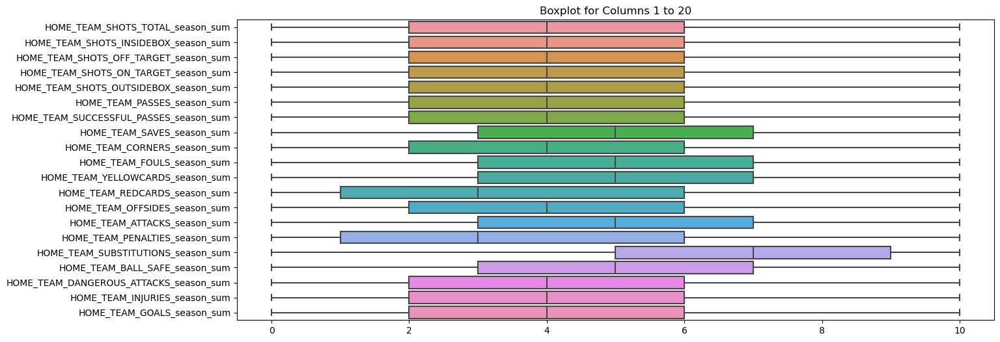

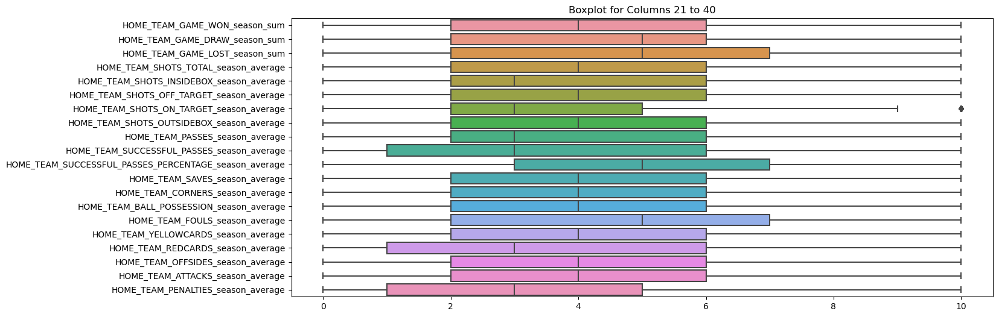

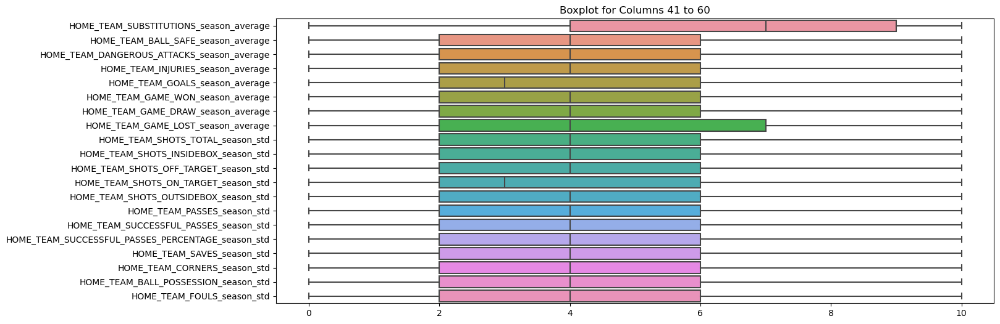

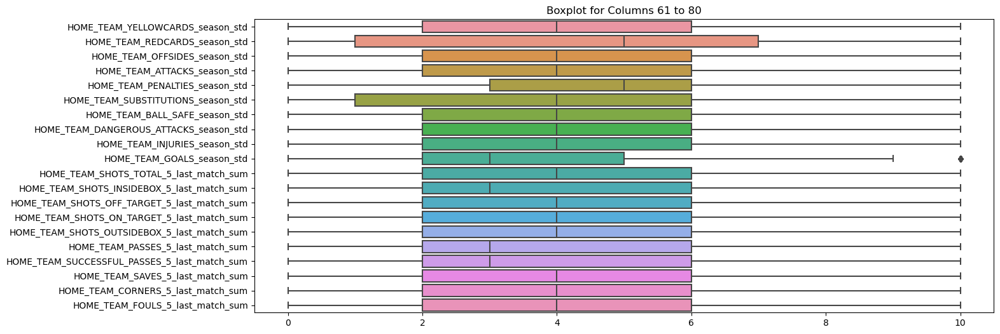

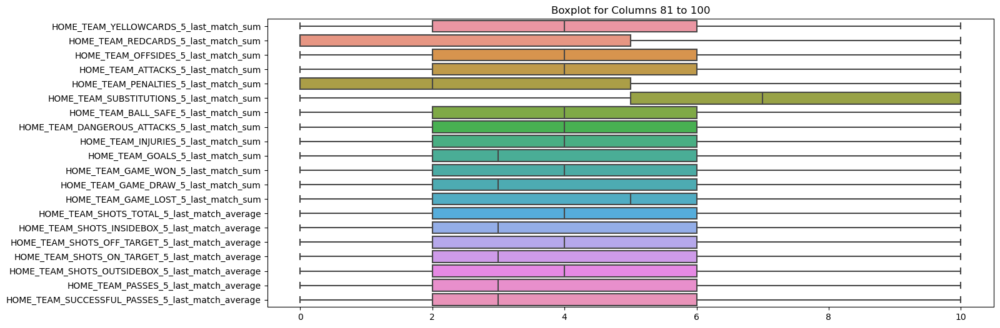

...

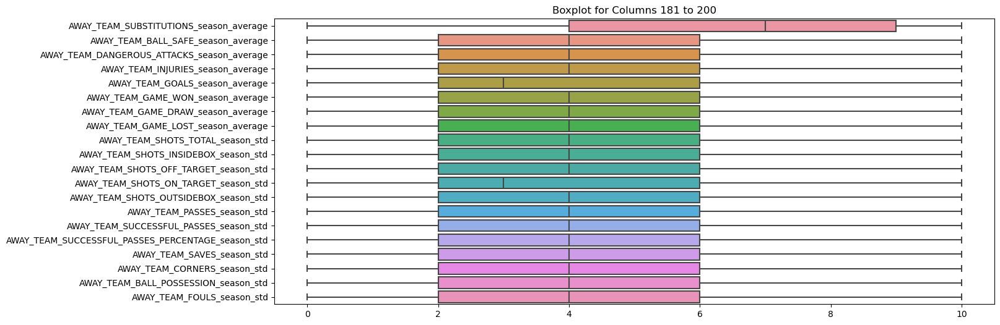

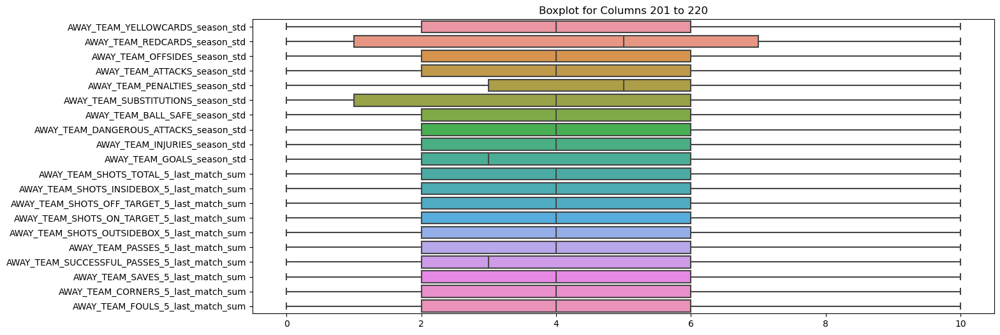

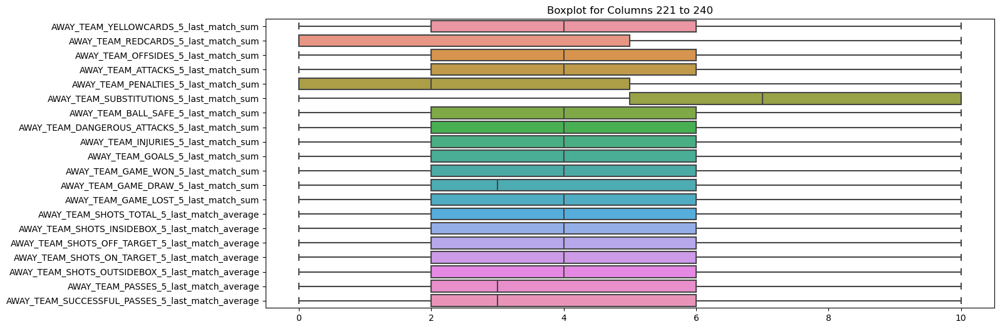

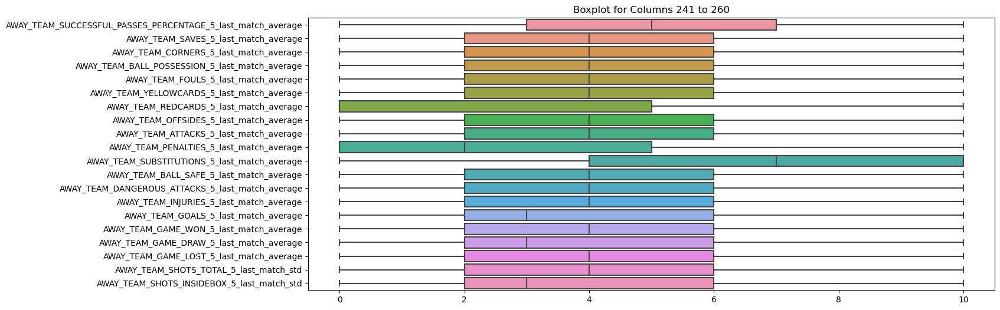

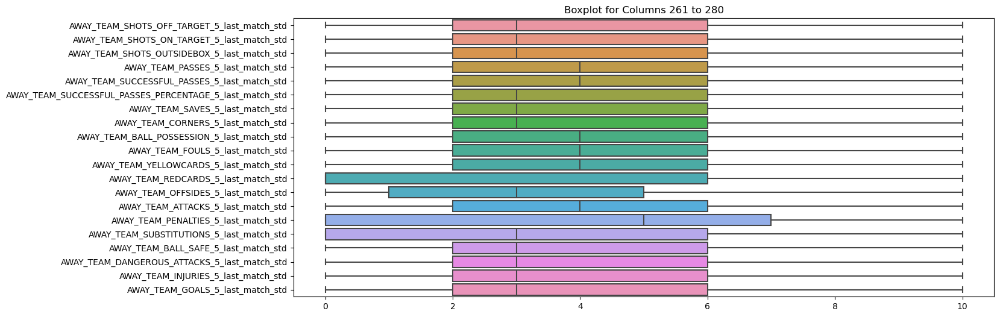

In [89]:
def plot_boxplots(df, group_size=20):
    num_columns = len(df.columns)
    for i in range(0, num_columns, group_size):
        columns = df.columns[i:i+group_size]
        plt.figure(figsize=(15, 6))
        sns.boxplot(data=df[columns], orient='h')
        plt.title(f"Boxplot for Columns {i+1} to {min(i+group_size, num_columns)}")
        plt.show()

plot_boxplots(train_data, group_size=20)

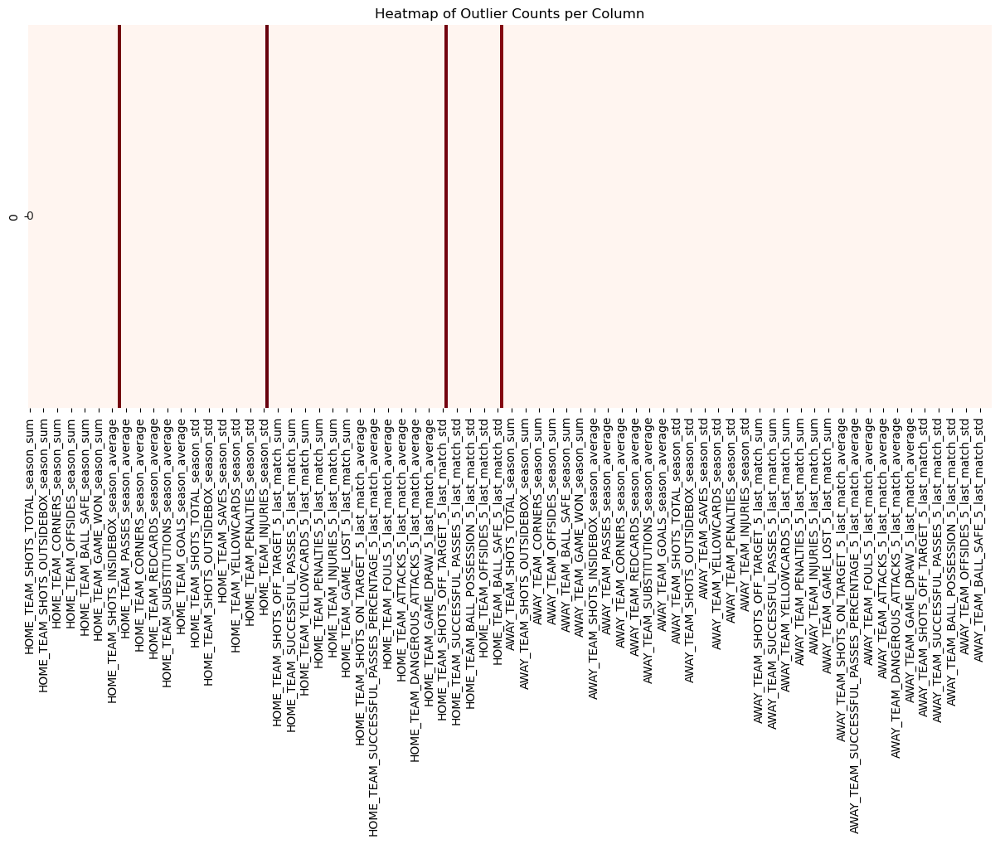

In [93]:
Q1 = train_data.quantile(0.25)
Q3 = train_data.quantile(0.75)
IQR = Q3 - Q1
outliers = ((train_data < (Q1 - 1.5 * IQR)) | (train_data > (Q3 + 1.5 * IQR)))
outlier_counts = outliers.sum()
plt.figure(figsize=(15, 6))
sns.heatmap(outlier_counts.to_frame().T, cmap='Reds', annot=True, cbar=False, fmt='d')
plt.title("Heatmap of Outlier Counts per Column")
plt.show()

In [94]:
Q1 = train_data.quantile(0.25)
Q3 = train_data.quantile(0.75)
IQR = Q3 - Q1
outliers = ((train_data < (Q1 - 1.5 * IQR)) | (train_data > (Q3 + 1.5 * IQR)))
outlier_counts = outliers.sum()
columns_with_outliers = outlier_counts[outlier_counts > 0]
outliers_summary = columns_with_outliers.reset_index()
outliers_summary.columns = ['Column', 'Number of Outliers']
outliers_summary = outliers_summary.sort_values(by='Number of Outliers', ascending=False)
print(outliers_summary)


                                         Column  Number of Outliers
1                    HOME_TEAM_GOALS_season_std                 663
0      HOME_TEAM_SHOTS_ON_TARGET_season_average                 645
2    HOME_TEAM_SHOTS_ON_TARGET_5_last_match_std                 645
3  HOME_TEAM_DANGEROUS_ATTACKS_5_last_match_std                 622


**Test Data**

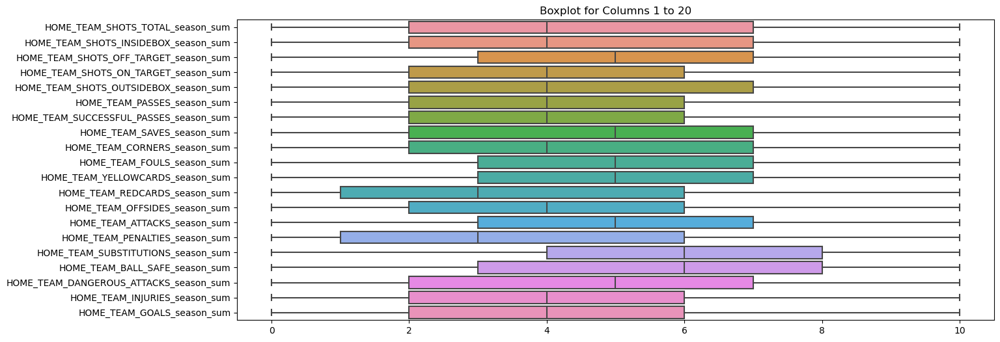

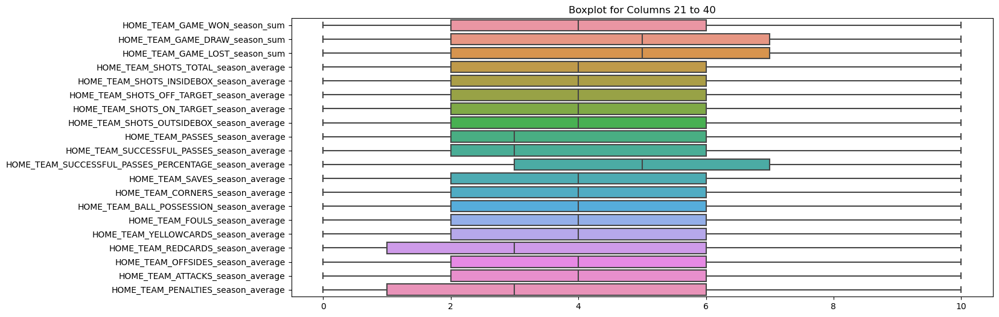

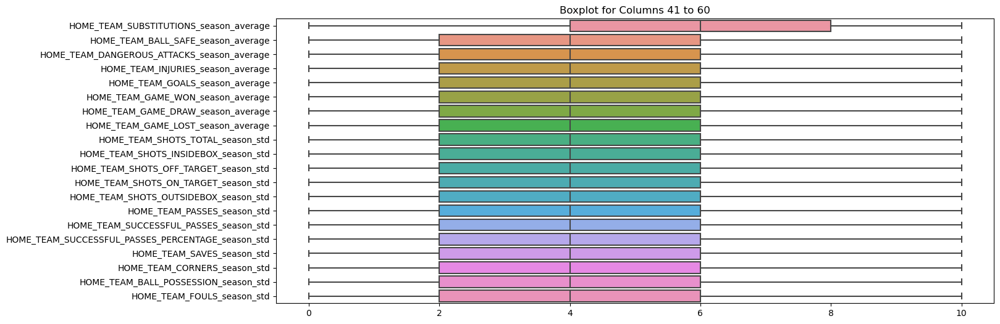

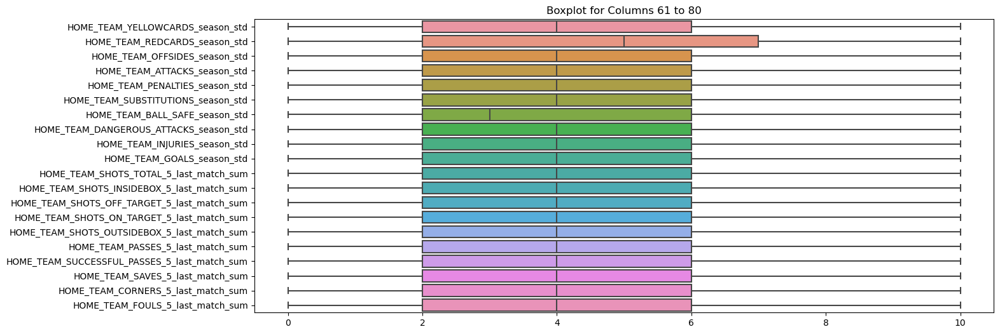

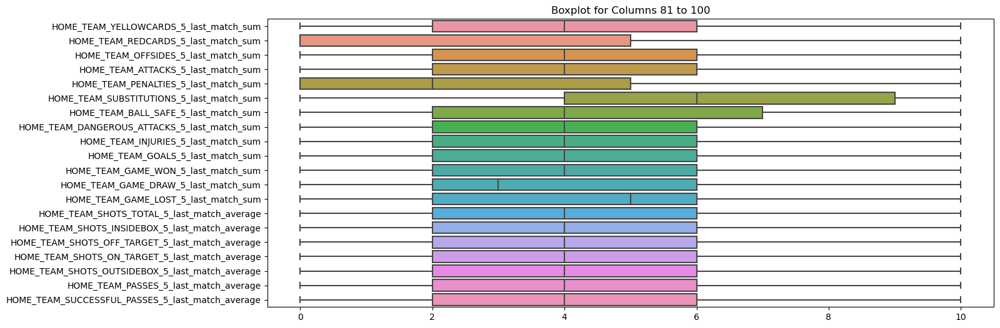

...

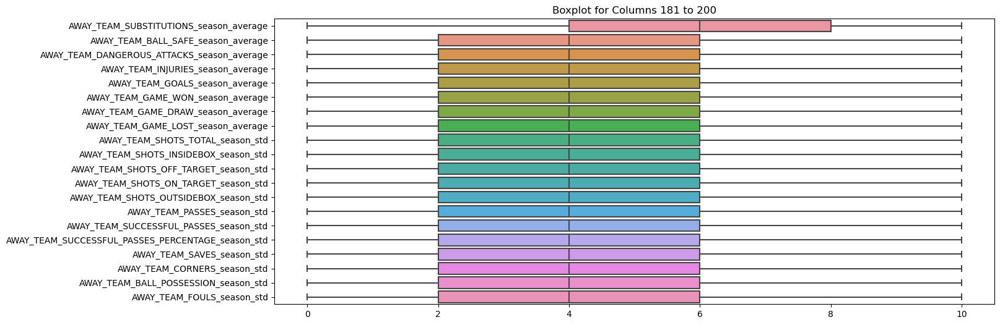

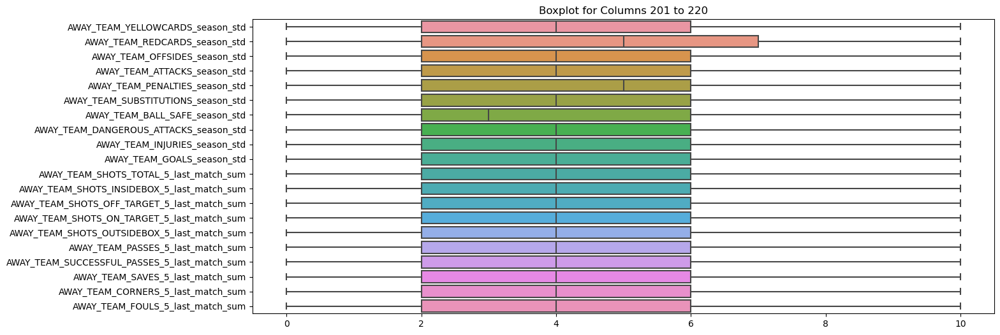

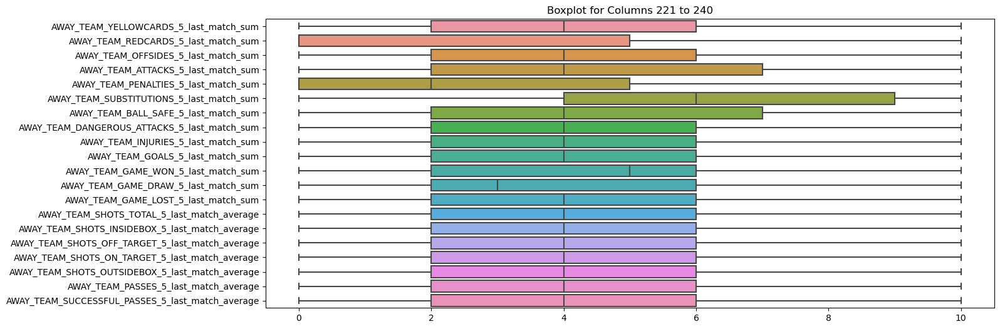

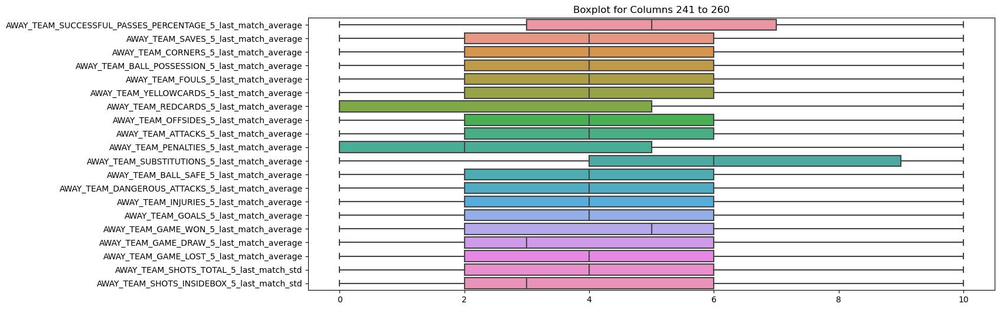

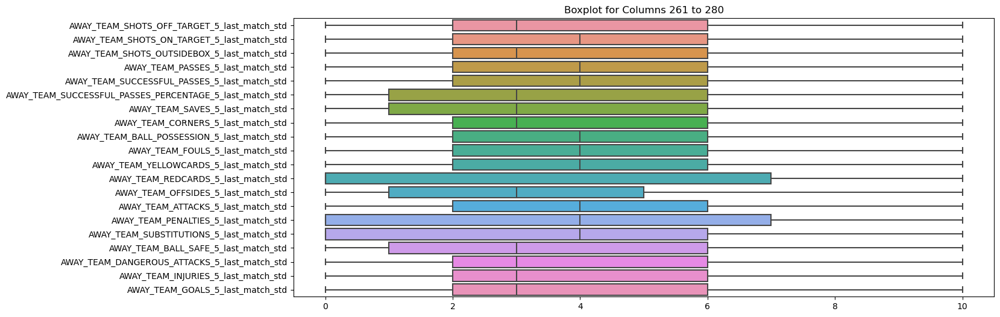

In [92]:
plot_boxplots(test_data, group_size=20)

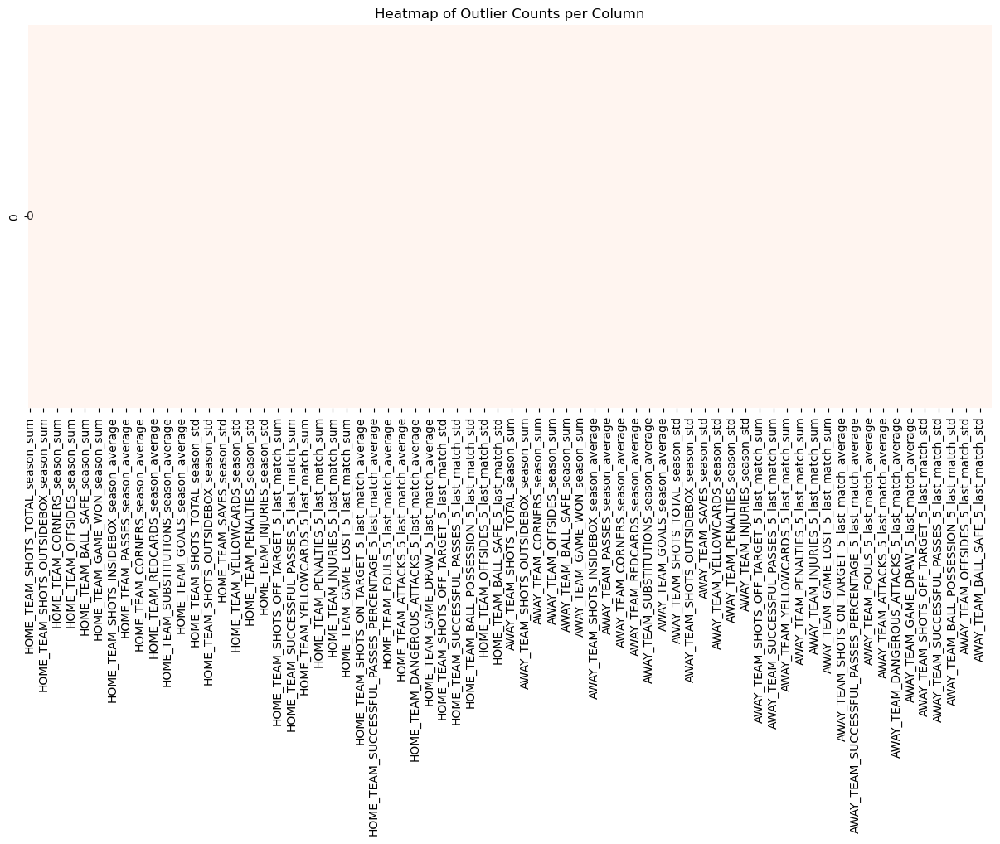

In [95]:
Q1 = test_data.quantile(0.25)
Q3 = test_data.quantile(0.75)
IQR = Q3 - Q1
outliers = ((test_data < (Q1 - 1.5 * IQR)) | (test_data > (Q3 + 1.5 * IQR)))
outlier_counts = outliers.sum()
plt.figure(figsize=(15, 6))
sns.heatmap(outlier_counts.to_frame().T, cmap='Reds', annot=True, cbar=False, fmt='d')
plt.title("Heatmap of Outlier Counts per Column")
plt.show()

In [96]:
Q1 = test_data.quantile(0.25)
Q3 = test_data.quantile(0.75)
IQR = Q3 - Q1
outliers = ((test_data < (Q1 - 1.5 * IQR)) | (test_data > (Q3 + 1.5 * IQR)))
outlier_counts = outliers.sum()
columns_with_outliers = outlier_counts[outlier_counts > 0]
outliers_summary = columns_with_outliers.reset_index()
outliers_summary.columns = ['Column', 'Number of Outliers']
outliers_summary = outliers_summary.sort_values(by='Number of Outliers', ascending=False)
print(outliers_summary)


Empty DataFrame
Columns: [Column, Number of Outliers]
Index: []


=> we can observe that test_data doesn't contain outliers

### <font color='MediumOrchid'> 4. Scores dataset

In [98]:
train_scores.head()

,HOME_WINS,DRAW,AWAY_WINS
ID,,,
0,0,0,1
1,0,1,0
2,0,0,1
3,1,0,0
4,0,1,0


In [99]:
train_scores.shape

(12303, 3)

In [100]:
train_scores.describe()

,HOME_WINS,DRAW,AWAY_WINS
count,12303.000000,12303.000000,12303.000000
mean,0.435341,0.258961,0.305698
std,0.495822,0.438082,0.460721
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000


### <font color='MediumOrchid'> 5. Correlation analysis

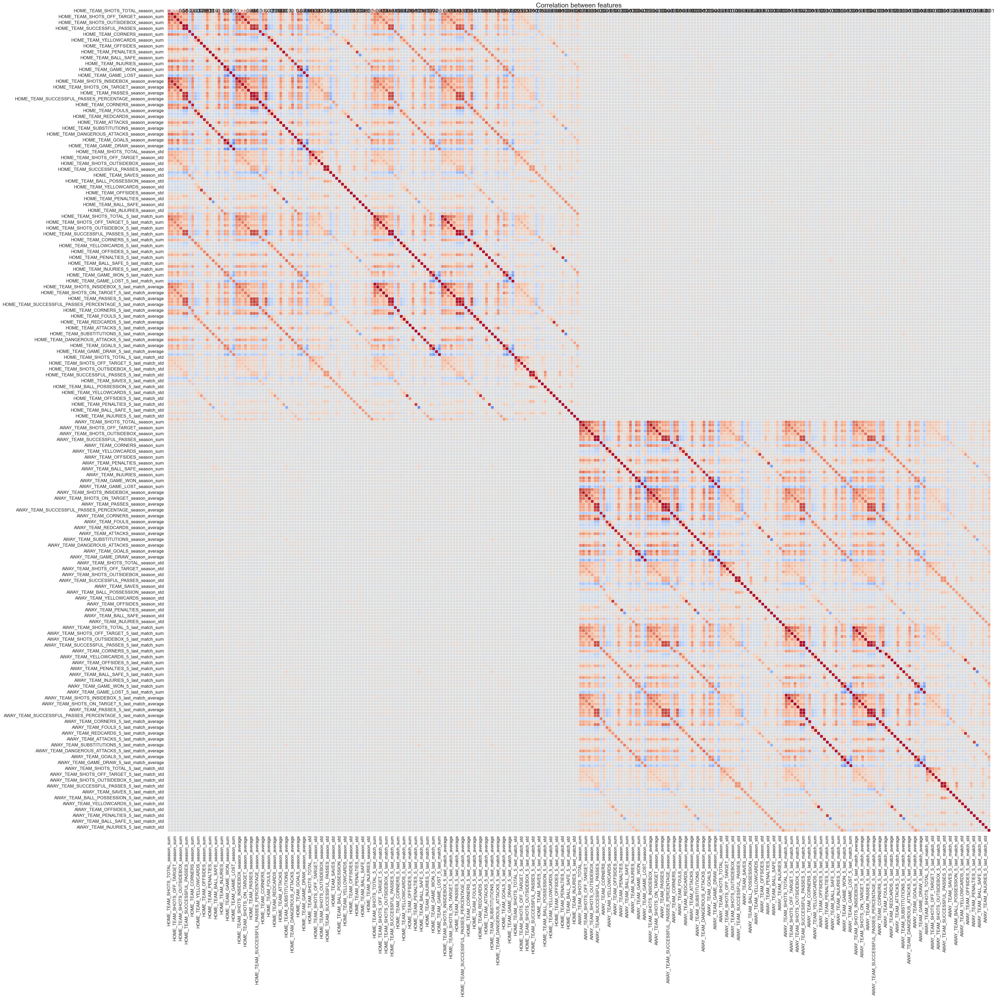

In [101]:
corr = train_data.corr()
sns.set(font_scale=1.15)
fig,ax=plt.subplots(figsize=(40,40))
sns.heatmap(corr, annot=True,linewidths=0.5,center=0,linecolor="white",cmap='coolwarm', fmt=".2f",cbar=False,square=True)
plt.title('Correlation between features',fontsize=18)
ax.tick_params(labelsize=12)

In [102]:
correlations = train_data.corr().abs().unstack().sort_values(ascending=False).reset_index()
correlations = correlations[correlations['level_0'] < correlations['level_1']]  
correlations.columns = ['name_first_column', 'name_second_column', 'correlation_percentage']

top_n = 15
most_important_correlations = correlations.head(top_n)

print("Most Important Correlations:")
print(most_important_correlations)

Most Important Correlations:
                                   name_first_column  \
280         HOME_TEAM_GAME_DRAW_5_last_match_average   
283         AWAY_TEAM_GAME_DRAW_5_last_match_average   
285         HOME_TEAM_GAME_LOST_5_last_match_average   
286          HOME_TEAM_GAME_WON_5_last_match_average   
289         AWAY_TEAM_GAME_LOST_5_last_match_average   
290          AWAY_TEAM_GAME_WON_5_last_match_average   
293          AWAY_TEAM_REDCARDS_5_last_match_average   
294          HOME_TEAM_REDCARDS_5_last_match_average   
297         AWAY_TEAM_PENALTIES_5_last_match_average   
299         HOME_TEAM_PENALTIES_5_last_match_average   
301           HOME_TEAM_CORNERS_5_last_match_average   
303           AWAY_TEAM_CORNERS_5_last_match_average   
305   AWAY_TEAM_SHOTS_ON_TARGET_5_last_match_average   
307  AWAY_TEAM_SHOTS_OFF_TARGET_5_last_match_average   
308  HOME_TEAM_SHOTS_OFF_TARGET_5_last_match_average   

                              name_second_column  correlation_percentage  

=> we can see that the statistics represented by (mean / average / std) provide the same information. Therefore, we can proceed by leaving only one of them. => the mean (average) is often the most informative summary statistic, as it reflects the central tendency of the data without being as sensitive to extreme values as the sum or the standard deviation. We are going to retain only the statistics representing the average in a further step

## <font color=' MidnightBlue'> Data Preprocessing 

### <font color='MediumOrchid'> 1. Data cleaning

#### <font color='DarkSlateBlue'> Handling missing values

**Train Data**

In [106]:
for column in train_data.columns:
    if train_data[column].isnull().any():
        mode_value = train_data[column].mode()[0]
        train_data[column].fillna(mode_value, inplace=True)

<Axes: ylabel='ID'>

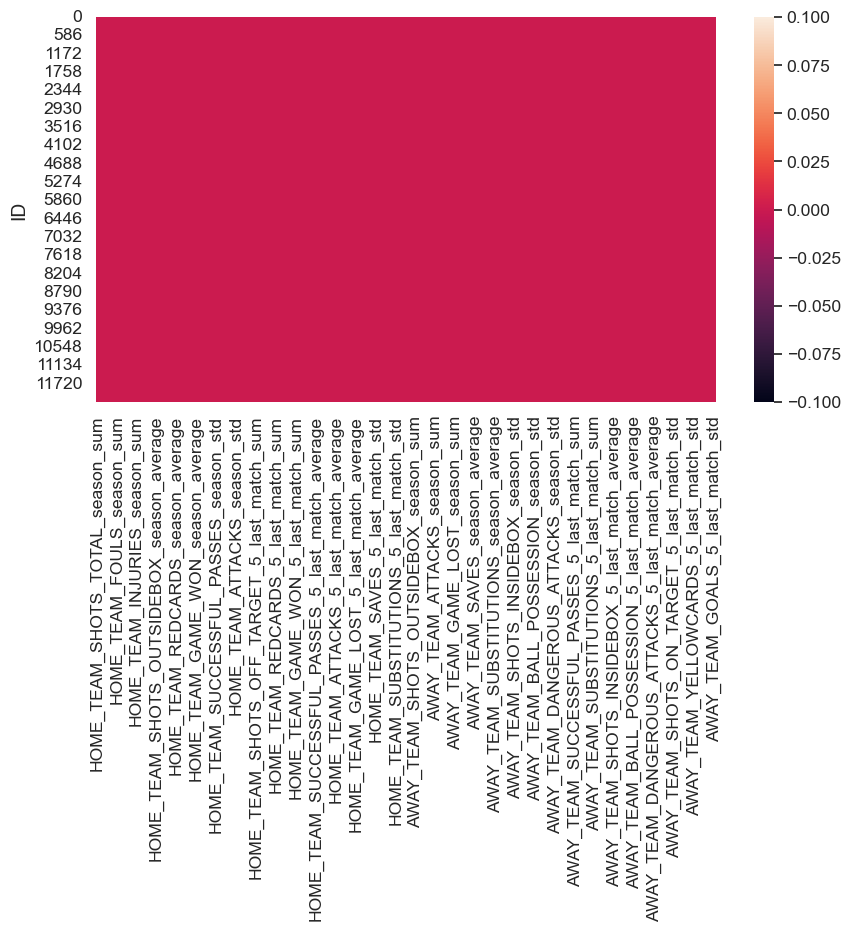

In [107]:
plt.figure(figsize=(10,5))
sns.heatmap(train_data.isnull())

**Test Data**

In [108]:
for column in test_data.columns:
    if test_data[column].isnull().any():
        mode_value = test_data[column].mode()[0]
        test_data[column].fillna(mode_value, inplace=True)

<Axes: ylabel='ID'>

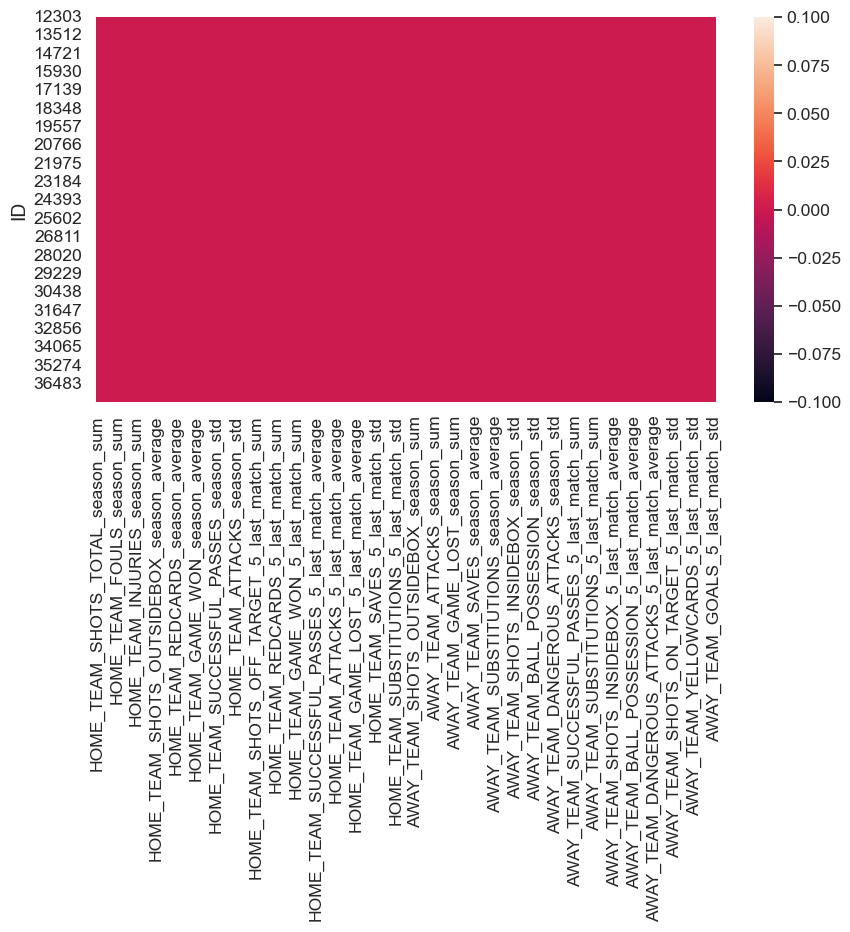

In [109]:
plt.figure(figsize=(10,5))
sns.heatmap(test_data.isnull())

=> we tried to impute the missing values using mean, median and mode and we concluded that the mode method gives a better accuracy  
=> we can observe that our datasets don't contain any missing values anymore

#### <font color='DarkSlateBlue'> Handling outliers

In [113]:
import pandas as pd

# Calculate Q1, Q3, and IQR for each column
Q1 = train_data.quantile(0.25)
Q3 = train_data.quantile(0.75)
IQR = Q3 - Q1

# Identify outliers (True for outliers)
outliers = ((train_data < (Q1 - 1.5 * IQR)) | (train_data > (Q3 + 1.5 * IQR)))

# Count the number of outliers for each column
outlier_counts = outliers.sum()

# Filter columns with at least one outlier
columns_with_outliers = outlier_counts[outlier_counts > 0]

# Convert to a DataFrame for readability
outliers_summary = columns_with_outliers.reset_index()
outliers_summary.columns = ['Column', 'Number of Outliers']

# Sort by number of outliers in descending order
outliers_summary = outliers_summary.sort_values(by='Number of Outliers', ascending=False)

# Display the result
print(outliers_summary)

                                               Column  Number of Outliers
22                HOME_TEAM_INJURIES_5_last_match_std                 757
40                AWAY_TEAM_INJURIES_5_last_match_std                 755
9                 HOME_TEAM_INJURIES_5_last_match_sum                 743
30                AWAY_TEAM_INJURIES_5_last_match_sum                 731
34            AWAY_TEAM_INJURIES_5_last_match_average                 687
27         AWAY_TEAM_SHOTS_INSIDEBOX_5_last_match_sum                 681
31     AWAY_TEAM_SHOTS_INSIDEBOX_5_last_match_average                 678
12            HOME_TEAM_INJURIES_5_last_match_average                 678
6                          HOME_TEAM_GOALS_season_std                 663
38                   AWAY_TEAM_SAVES_5_last_match_std                 647
1            HOME_TEAM_SHOTS_ON_TARGET_season_average                 645
15         HOME_TEAM_SHOTS_ON_TARGET_5_last_match_std                 645
35        AWAY_TEAM_SHOTS_OUTSIDEBOX_5

=> we can see that the imputation of missing values caused a large increase in the number of outliers 

In [116]:
columns_outliers = [
    'HOME_TEAM_INJURIES_5_last_match_std',
    'AWAY_TEAM_INJURIES_5_last_match_std',
    'HOME_TEAM_INJURIES_5_last_match_sum',
    'AWAY_TEAM_INJURIES_5_last_match_sum',
    'AWAY_TEAM_INJURIES_5_last_match_average',
    'AWAY_TEAM_SHOTS_INSIDEBOX_5_last_match_sum',
    'AWAY_TEAM_SHOTS_INSIDEBOX_5_last_match_average',
    'HOME_TEAM_INJURIES_5_last_match_average',
    'HOME_TEAM_GOALS_season_std',
    'AWAY_TEAM_SAVES_5_last_match_std',
    'HOME_TEAM_SHOTS_ON_TARGET_season_average',
    'HOME_TEAM_SHOTS_ON_TARGET_5_last_match_std',
    'AWAY_TEAM_SHOTS_OUTSIDEBOX_5_last_match_std',
    'HOME_TEAM_SAVES_5_last_match_std',
    'HOME_TEAM_DANGEROUS_ATTACKS_5_last_match_std',
    'AWAY_TEAM_PASSES_5_last_match_std',
    'AWAY_TEAM_PASSES_5_last_match_sum',
    'AWAY_TEAM_SUCCESSFUL_PASSES_5_last_match_sum',
    'AWAY_TEAM_SUCCESSFUL_PASSES_5_last_match_average',
    'AWAY_TEAM_BALL_SAFE_5_last_match_std',
    'AWAY_TEAM_PASSES_5_last_match_average',
    'HOME_TEAM_PASSES_season_average',
    'AWAY_TEAM_SUCCESSFUL_PASSES_season_average',
    'HOME_TEAM_SHOTS_TOTAL_5_last_match_std',
    'AWAY_TEAM_PASSES_season_average',
    'HOME_TEAM_SHOTS_INSIDEBOX_season_average',
    'HOME_TEAM_BALL_SAFE_5_last_match_std',
    'HOME_TEAM_SHOTS_INSIDEBOX_5_last_match_std',
    'HOME_TEAM_SHOTS_OUTSIDEBOX_season_std',
    'HOME_TEAM_SUCCESSFUL_PASSES_season_average',
    'AWAY_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_std',
    'AWAY_TEAM_SHOTS_OUTSIDEBOX_season_std',
    'HOME_TEAM_SUCCESSFUL_PASSES_5_last_match_std',
    'HOME_TEAM_PASSES_5_last_match_std',
    'HOME_TEAM_SUCCESSFUL_PASSES_5_last_match_average',
    'HOME_TEAM_PASSES_5_last_match_sum',
    'HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_std',
    'HOME_TEAM_SUCCESSFUL_PASSES_5_last_match_sum',
    'HOME_TEAM_PASSES_5_last_match_average',
    'HOME_TEAM_INJURIES_season_std',
    'AWAY_TEAM_INJURIES_season_std'
]


* **Using Log transformation**

In [117]:
def handle_outliers_log(data, columns_outliers):
    for column in columns_outliers:
        data[column] = np.log1p(data[column])  

handle_outliers_log(train_data, columns_outliers)
handle_outliers_log(test_data, columns_outliers)

we used log1p to avoid issues with zero values

* **Using IQR method**

In [ ]:
def handle_outliers_iqr(data):
    Q1 = data[columns_outliers].quantile(0.25)
    Q3 = data[columns_outliers].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    data[columns_outliers] = np.where(data[columns_outliers] < lower_bound, lower_bound, data[columns_outliers])
    data[columns_outliers] = np.where(data[columns_outliers] > upper_bound, upper_bound, data[columns_outliers])

handle_outliers_iqr(train_data)
handle_outliers_iqr(test_data)

=> after trying and testing our models with the 2 methods, we concluded that log transformation gives a better accuracy.

#### <font color='DarkSlateBlue'> Handling scores dataset

* **Ordinal Encoding**

In [120]:
train_scores['label'] = train_scores.idxmax(axis=1).map({'HOME_WINS': 0, 'DRAW': 1, 'AWAY_WINS': 2})
train_scores = train_scores[['label']]
train_scores.head()


,label
ID,
0,2
1,1
2,2
3,0
4,1


* **Concat with datasets**

In [121]:
train_data_reset = train_data.reset_index(drop=True)  
train_scores_reset = train_scores.reset_index(drop=True)  
train_data = pd.merge(train_data_reset, train_scores_reset[['label']], left_index=True, right_index=True, how='left')
train_data.head()

,HOME_TEAM_SHOTS_TOTAL_season_sum,HOME_TEAM_SHOTS_INSIDEBOX_season_sum,HOME_TEAM_SHOTS_OFF_TARGET_season_sum,HOME_TEAM_SHOTS_ON_TARGET_season_sum,HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum,HOME_TEAM_PASSES_season_sum,HOME_TEAM_SUCCESSFUL_PASSES_season_sum,HOME_TEAM_SAVES_season_sum,HOME_TEAM_CORNERS_season_sum,HOME_TEAM_FOULS_season_sum,...,AWAY_TEAM_REDCARDS_5_last_match_std,AWAY_TEAM_OFFSIDES_5_last_match_std,AWAY_TEAM_ATTACKS_5_last_match_std,AWAY_TEAM_PENALTIES_5_last_match_std,AWAY_TEAM_SUBSTITUTIONS_5_last_match_std,AWAY_TEAM_BALL_SAFE_5_last_match_std,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_std,AWAY_TEAM_INJURIES_5_last_match_std,AWAY_TEAM_GOALS_5_last_match_std,label
0,3.0,2.0,5.0,2.0,1.0,2.0,2.0,5.0,3.0,6.0,...,5.0,4.0,0.0,6.0,8.0,1.609438,3.0,1.098612,3.0,2
1,6.0,8.0,3.0,6.0,5.0,8.0,7.0,10.0,6.0,8.0,...,0.0,3.0,1.0,8.0,4.0,2.397895,0.0,1.791759,3.0,1
2,4.0,2.0,5.0,2.0,8.0,1.0,1.0,2.0,2.0,7.0,...,10.0,4.0,4.0,0.0,8.0,1.386294,0.0,2.302585,6.0,2
3,7.0,5.0,5.0,6.0,6.0,9.0,9.0,2.0,2.0,0.0,...,0.0,1.0,2.0,0.0,5.0,1.945910,3.0,1.386294,2.0,0
4,3.0,3.0,2.0,3.0,4.0,4.0,3.0,4.0,4.0,7.0,...,0.0,4.0,4.0,9.0,4.0,0.693147,4.0,1.945910,5.0,1


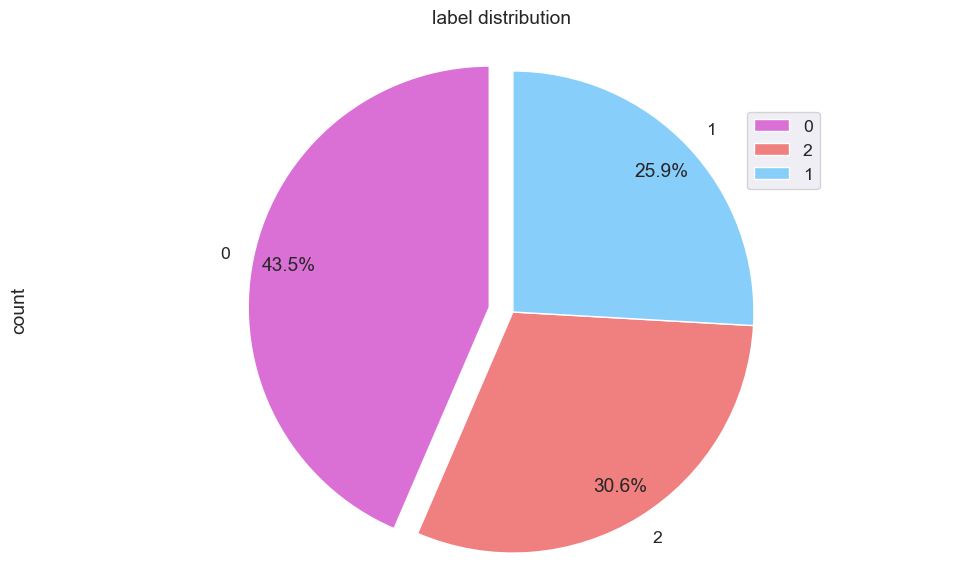

In [130]:
plt.figure(figsize=(10, 6))
    
class_counts = train_data['label'].value_counts()
    
pie_colors = ['orchid', 'lightcoral', 'lightskyblue']
    
r = class_counts.plot(
        kind='pie',
        explode=[0.1] + [0] * (len(class_counts) - 1),
        startangle=90,
        autopct='%1.1f%%',
        colors=pie_colors,
        pctdistance=0.85 
  )
    
plt.title('label distribution', pad=20) 
plt.axis('equal')  
plt.legend(class_counts.index, loc='best', bbox_to_anchor=(0.85, 0.9))
plt.subplots_adjust(top=0.85)  
plt.tight_layout()
plt.show()

=> **home_wins** : 43.5% / **draw** : 30.6% / **away_wins** : 25.9%

### <font color='MediumOrchid'> 2. Feature Selection

#### <font color='DarkSlateBlue'> Based on the Correlation Analysis

As we previously mentionned, we are going to leave only the statistics representing the average, based on the correlation analysis we did

**Train Data**

In [126]:
columns_to_keep = [col for col in train_data.columns if col.endswith('_average')] + ['label']
train_data = train_data[columns_to_keep]
train_data.head()

,HOME_TEAM_SHOTS_TOTAL_season_average,HOME_TEAM_SHOTS_INSIDEBOX_season_average,HOME_TEAM_SHOTS_OFF_TARGET_season_average,HOME_TEAM_SHOTS_ON_TARGET_season_average,HOME_TEAM_SHOTS_OUTSIDEBOX_season_average,HOME_TEAM_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average,HOME_TEAM_SAVES_season_average,HOME_TEAM_CORNERS_season_average,...,AWAY_TEAM_PENALTIES_5_last_match_average,AWAY_TEAM_SUBSTITUTIONS_5_last_match_average,AWAY_TEAM_BALL_SAFE_5_last_match_average,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_average,AWAY_TEAM_INJURIES_5_last_match_average,AWAY_TEAM_GOALS_5_last_match_average,AWAY_TEAM_GAME_WON_5_last_match_average,AWAY_TEAM_GAME_DRAW_5_last_match_average,AWAY_TEAM_GAME_LOST_5_last_match_average,label
0,3.0,1.098612,4.0,1.098612,1.0,1.098612,0.693147,2.0,5.0,3.0,...,10.0,4.0,0.0,6.0,0.000000,4.0,7.0,0.0,5.0,2
1,5.0,2.079442,2.0,1.791759,2.0,1.791759,1.791759,6.0,9.0,5.0,...,5.0,4.0,0.0,4.0,1.386294,2.0,2.0,3.0,7.0,1
2,4.0,1.098612,4.0,1.098612,7.0,0.693147,0.693147,1.0,2.0,2.0,...,0.0,6.0,4.0,8.0,1.945910,1.0,2.0,2.0,7.0,2
3,7.0,1.791759,6.0,2.079442,6.0,2.302585,2.302585,9.0,2.0,3.0,...,0.0,4.0,2.0,5.0,1.386294,3.0,2.0,2.0,7.0,0
4,2.0,1.386294,1.0,1.098612,3.0,1.386294,1.386294,5.0,4.0,4.0,...,10.0,7.0,1.0,4.0,1.386294,8.0,4.0,3.0,6.0,1


**Test Data**

In [128]:
columns_to_keep = [col for col in test_data.columns if col.endswith('_average')] 
test_data = test_data[columns_to_keep]
test_data.head()

,HOME_TEAM_SHOTS_TOTAL_season_average,HOME_TEAM_SHOTS_INSIDEBOX_season_average,HOME_TEAM_SHOTS_OFF_TARGET_season_average,HOME_TEAM_SHOTS_ON_TARGET_season_average,HOME_TEAM_SHOTS_OUTSIDEBOX_season_average,HOME_TEAM_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average,HOME_TEAM_SAVES_season_average,HOME_TEAM_CORNERS_season_average,...,AWAY_TEAM_ATTACKS_5_last_match_average,AWAY_TEAM_PENALTIES_5_last_match_average,AWAY_TEAM_SUBSTITUTIONS_5_last_match_average,AWAY_TEAM_BALL_SAFE_5_last_match_average,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_average,AWAY_TEAM_INJURIES_5_last_match_average,AWAY_TEAM_GOALS_5_last_match_average,AWAY_TEAM_GAME_WON_5_last_match_average,AWAY_TEAM_GAME_DRAW_5_last_match_average,AWAY_TEAM_GAME_LOST_5_last_match_average
ID,,,,,,,,,,,,,,,,,,,,,
12303,2.0,1.791759,4.0,0.000000,2.0,1.945910,1.945910,5.0,9.0,5.0,...,6.0,0.0,6.0,8.0,5.0,1.945910,0.0,0.0,3.0,10.0
12304,3.0,1.098612,5.0,1.098612,7.0,0.693147,0.693147,1.0,2.0,5.0,...,2.0,5.0,6.0,5.0,5.0,2.397895,8.0,7.0,5.0,0.0
12305,7.0,2.397895,8.0,2.197225,1.0,1.609438,1.609438,6.0,1.0,10.0,...,3.0,0.0,5.0,7.0,0.0,1.386294,3.0,2.0,5.0,7.0
12306,3.0,1.945910,3.0,2.197225,2.0,1.945910,1.945910,5.0,2.0,3.0,...,3.0,6.0,0.0,0.0,5.0,1.791759,5.0,2.0,6.0,6.0
12307,3.0,1.386294,3.0,1.098612,3.0,0.000000,0.000000,0.0,1.0,1.0,...,7.0,0.0,2.0,3.0,7.0,1.098612,1.0,5.0,6.0,2.0


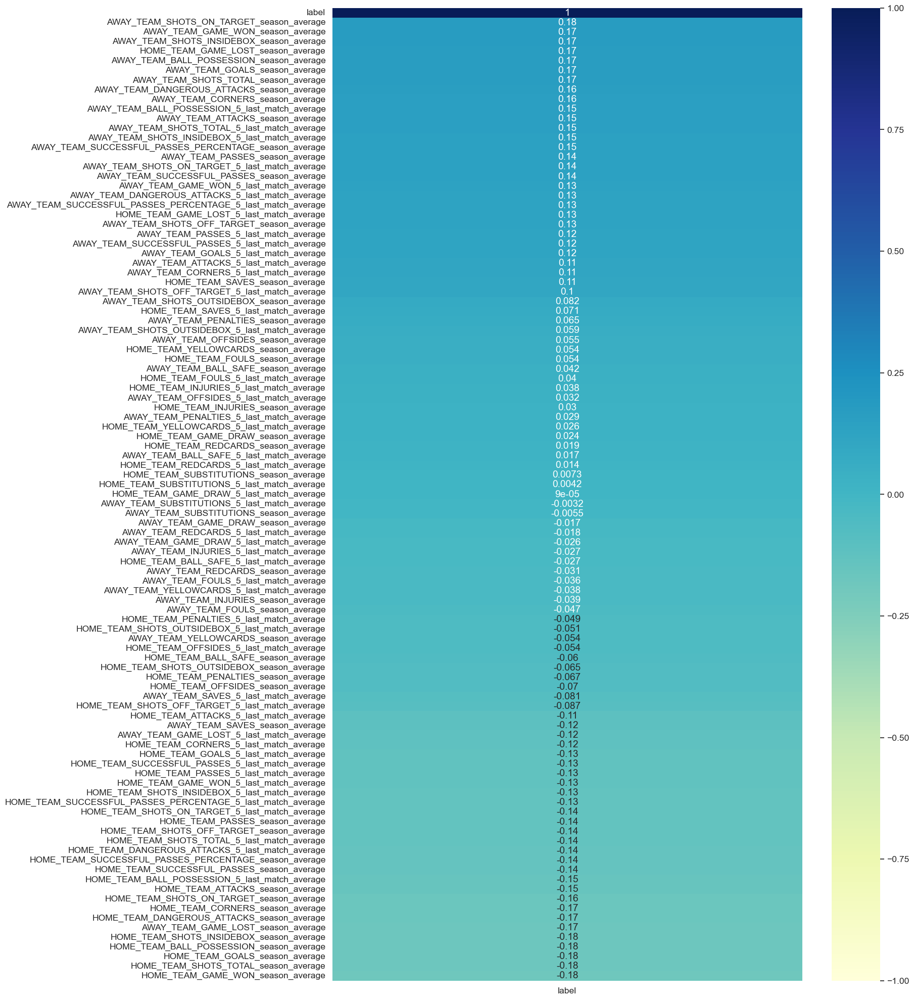

In [152]:
fig, ax = plt.subplots(figsize=(15,25))
sns.heatmap(train_data.corr()[['label']].sort_values('label'),
 vmax=1, vmin=-1, cmap='YlGnBu', annot=True, ax=ax);
ax.invert_yaxis()

#### <font color='DarkSlateBlue'> SelectKBest

In [136]:
X = train_data.drop(columns=['label'])
Y = train_data['label']

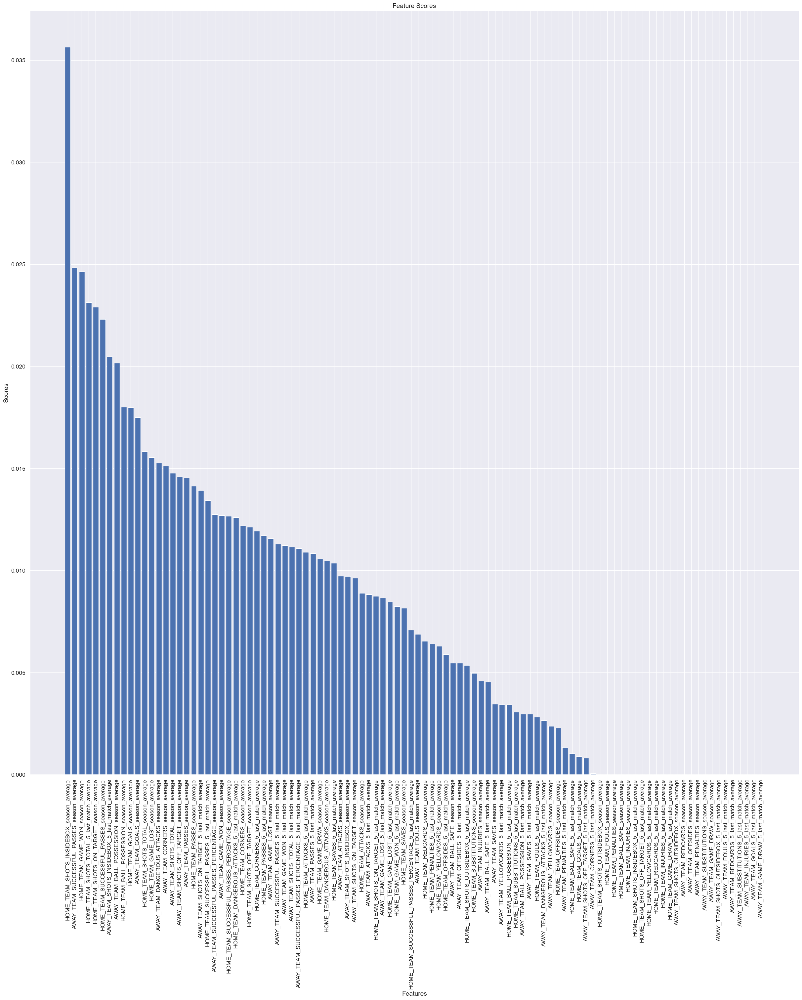

In [137]:
k_best_selector = SelectKBest(score_func=mutual_info_classif, k='all')  
X_train_selected = k_best_selector.fit_transform(X, Y)
feature_scores = k_best_selector.scores_
feature_score_pairs = list(zip(X.columns, feature_scores))
feature_score_pairs = sorted(feature_score_pairs, key=lambda x: x[1], reverse=True)
features, scores = zip(*feature_score_pairs)

plt.figure(figsize=(30, 30))
plt.bar(range(len(features)), scores, align='center')
plt.xticks(range(len(features)), features, rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Scores')
plt.title('Feature Scores')
plt.show()



In [138]:
selector = SelectKBest(score_func=mutual_info_classif, k='all')
selector.fit(X, Y)
feature_scores = selector.scores_
threshold = np.var(feature_scores)
selected_features = X.columns[feature_scores >= threshold]
removed_features = X.columns[feature_scores < threshold]

print("Selected features:")
print(selected_features)
print("\nFeatures below the threshold (to be removed):")
print(removed_features)

Selected features:
Index(['HOME_TEAM_SHOTS_TOTAL_season_average',
       'HOME_TEAM_SHOTS_INSIDEBOX_season_average',
       'HOME_TEAM_SHOTS_OFF_TARGET_season_average',
       'HOME_TEAM_SHOTS_ON_TARGET_season_average',
       'HOME_TEAM_PASSES_season_average',
       'HOME_TEAM_SUCCESSFUL_PASSES_season_average',
       'HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average',
       'HOME_TEAM_SAVES_season_average', 'HOME_TEAM_CORNERS_season_average',
       'HOME_TEAM_BALL_POSSESSION_season_average',
       'HOME_TEAM_ATTACKS_season_average',
       'HOME_TEAM_PENALTIES_season_average',
       'HOME_TEAM_BALL_SAFE_season_average',
       'HOME_TEAM_DANGEROUS_ATTACKS_season_average',
       'HOME_TEAM_INJURIES_season_average', 'HOME_TEAM_GOALS_season_average',
       'HOME_TEAM_GAME_WON_season_average',
       'HOME_TEAM_GAME_DRAW_season_average',
       'HOME_TEAM_GAME_LOST_season_average',
       'HOME_TEAM_SHOTS_TOTAL_5_last_match_average',
       'HOME_TEAM_SHOTS_INSIDEBOX_5_last_m

#### <font color='DarkSlateBlue'> RFE : Recursive Feature Elimination

In [140]:
model = LogisticRegression(max_iter=1000)
rfe = RFE(estimator=model, n_features_to_select=50)  
rfe.fit(X, Y)
selected_features_rfe = X.columns[rfe.support_]
removed_features_rfe = X.columns[~rfe.support_]

print("Selected features by RFE:")
print(selected_features_rfe)

print("\nRemoved features by RFE:")
print(removed_features_rfe)


Selected features by RFE:
Index(['HOME_TEAM_SHOTS_TOTAL_season_average',
       'HOME_TEAM_SHOTS_INSIDEBOX_season_average',
       'HOME_TEAM_SHOTS_ON_TARGET_season_average',
       'HOME_TEAM_SHOTS_OUTSIDEBOX_season_average',
       'HOME_TEAM_PASSES_season_average',
       'HOME_TEAM_SUCCESSFUL_PASSES_season_average',
       'HOME_TEAM_SAVES_season_average',
       'HOME_TEAM_BALL_POSSESSION_season_average',
       'HOME_TEAM_ATTACKS_season_average', 'HOME_TEAM_GOALS_season_average',
       'HOME_TEAM_GAME_WON_season_average',
       'HOME_TEAM_GAME_DRAW_season_average',
       'HOME_TEAM_GAME_LOST_season_average',
       'HOME_TEAM_SHOTS_ON_TARGET_5_last_match_average',
       'HOME_TEAM_PASSES_5_last_match_average',
       'HOME_TEAM_SUCCESSFUL_PASSES_5_last_match_average',
       'HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average',
       'HOME_TEAM_CORNERS_5_last_match_average',
       'HOME_TEAM_BALL_POSSESSION_5_last_match_average',
       'HOME_TEAM_OFFSIDES_5_last_m

#### <font color='DarkSlateBlue'> Random Forest Feature Importance

Random Forest is a tree-based method that can provide feature importance scores for each feature. It works well for classification tasks and will help to identify which features contribute most to the prediction of the target classes

In [144]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, Y)
importances = rf.feature_importances_

indices = importances.argsort()[::-1]  
for i in range(100):  
    print(f"{X.columns[indices[i]]}: {importances[indices[i]]}")


HOME_TEAM_GAME_LOST_season_average: 0.013460330715448039
HOME_TEAM_GAME_WON_season_average: 0.013089586575352452
AWAY_TEAM_GAME_LOST_season_average: 0.012704495166094107
AWAY_TEAM_GAME_WON_season_average: 0.011791465640744722
AWAY_TEAM_SHOTS_ON_TARGET_season_average: 0.011735164014409575
HOME_TEAM_BALL_POSSESSION_season_average: 0.011320927033485974
HOME_TEAM_SHOTS_ON_TARGET_season_average: 0.011262244018462939
AWAY_TEAM_BALL_POSSESSION_season_average: 0.011260426789028343
AWAY_TEAM_SAVES_season_average: 0.01122919281950525
AWAY_TEAM_YELLOWCARDS_5_last_match_average: 0.011137060334486205
HOME_TEAM_GAME_DRAW_season_average: 0.011131762357862448
HOME_TEAM_DANGEROUS_ATTACKS_season_average: 0.011086405830951804
AWAY_TEAM_GAME_DRAW_season_average: 0.011057053273182293
HOME_TEAM_YELLOWCARDS_5_last_match_average: 0.011013531039078506
AWAY_TEAM_YELLOWCARDS_season_average: 0.011001127650160925
HOME_TEAM_GOALS_season_average: 0.010994400824462468
AWAY_TEAM_BALL_SAFE_5_last_match_average: 0.01099

In [146]:
threshold = 0.009
features_to_remove = X.columns[importances < threshold]
print(f"Number of features to remove: {len(features_to_remove)}")
print("Features to remove:")
for feature in features_to_remove:
    print(feature)


Number of features to remove: 19
Features to remove:
HOME_TEAM_PASSES_season_average
HOME_TEAM_SUCCESSFUL_PASSES_season_average
HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average
HOME_TEAM_SHOTS_INSIDEBOX_5_last_match_average
HOME_TEAM_PASSES_5_last_match_average
HOME_TEAM_SUCCESSFUL_PASSES_5_last_match_average
HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average
HOME_TEAM_REDCARDS_5_last_match_average
HOME_TEAM_PENALTIES_5_last_match_average
HOME_TEAM_SUBSTITUTIONS_5_last_match_average
HOME_TEAM_GAME_DRAW_5_last_match_average
AWAY_TEAM_PASSES_season_average
AWAY_TEAM_SUCCESSFUL_PASSES_season_average
AWAY_TEAM_PASSES_5_last_match_average
AWAY_TEAM_SUCCESSFUL_PASSES_5_last_match_average
AWAY_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average
AWAY_TEAM_REDCARDS_5_last_match_average
AWAY_TEAM_PENALTIES_5_last_match_average
AWAY_TEAM_GAME_DRAW_5_last_match_average


=> we can observe that the features to be removed provided by each technique are different.  
Therefore, we are going to remove the features proposed by each feature selection technique and see its impact on the accuracy of our models

#### <font color='DarkSlateBlue'> Final datasets 

In [153]:
train_data.head()

,HOME_TEAM_SHOTS_TOTAL_season_average,HOME_TEAM_SHOTS_INSIDEBOX_season_average,HOME_TEAM_SHOTS_OFF_TARGET_season_average,HOME_TEAM_SHOTS_ON_TARGET_season_average,HOME_TEAM_SHOTS_OUTSIDEBOX_season_average,HOME_TEAM_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average,HOME_TEAM_SAVES_season_average,HOME_TEAM_CORNERS_season_average,...,AWAY_TEAM_PENALTIES_5_last_match_average,AWAY_TEAM_SUBSTITUTIONS_5_last_match_average,AWAY_TEAM_BALL_SAFE_5_last_match_average,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_average,AWAY_TEAM_INJURIES_5_last_match_average,AWAY_TEAM_GOALS_5_last_match_average,AWAY_TEAM_GAME_WON_5_last_match_average,AWAY_TEAM_GAME_DRAW_5_last_match_average,AWAY_TEAM_GAME_LOST_5_last_match_average,label
0,3.0,1.098612,4.0,1.098612,1.0,1.098612,0.693147,2.0,5.0,3.0,...,10.0,4.0,0.0,6.0,0.000000,4.0,7.0,0.0,5.0,2
1,5.0,2.079442,2.0,1.791759,2.0,1.791759,1.791759,6.0,9.0,5.0,...,5.0,4.0,0.0,4.0,1.386294,2.0,2.0,3.0,7.0,1
2,4.0,1.098612,4.0,1.098612,7.0,0.693147,0.693147,1.0,2.0,2.0,...,0.0,6.0,4.0,8.0,1.945910,1.0,2.0,2.0,7.0,2
3,7.0,1.791759,6.0,2.079442,6.0,2.302585,2.302585,9.0,2.0,3.0,...,0.0,4.0,2.0,5.0,1.386294,3.0,2.0,2.0,7.0,0
4,2.0,1.386294,1.0,1.098612,3.0,1.386294,1.386294,5.0,4.0,4.0,...,10.0,7.0,1.0,4.0,1.386294,8.0,4.0,3.0,6.0,1


In [149]:
features_removed_SKB = [
    'HOME_TEAM_SHOTS_OUTSIDEBOX_season_average',
    'HOME_TEAM_FOULS_season_average',
    'HOME_TEAM_YELLOWCARDS_season_average',
    'HOME_TEAM_REDCARDS_season_average',
    'HOME_TEAM_OFFSIDES_season_average',
    'HOME_TEAM_SUBSTITUTIONS_season_average',
    'HOME_TEAM_SHOTS_OUTSIDEBOX_5_last_match_average',
    'HOME_TEAM_FOULS_5_last_match_average',
    'HOME_TEAM_YELLOWCARDS_5_last_match_average',
    'HOME_TEAM_REDCARDS_5_last_match_average',
    'HOME_TEAM_GAME_DRAW_5_last_match_average',
    'AWAY_TEAM_OFFSIDES_season_average',
    'AWAY_TEAM_BALL_SAFE_season_average',
    'AWAY_TEAM_SHOTS_OFF_TARGET_5_last_match_average',
    'AWAY_TEAM_YELLOWCARDS_5_last_match_average',
    'AWAY_TEAM_REDCARDS_5_last_match_average',
    'AWAY_TEAM_OFFSIDES_5_last_match_average',
    'AWAY_TEAM_PENALTIES_5_last_match_average',
    'AWAY_TEAM_INJURIES_5_last_match_average'
]
df_cleaned_SKB = train_data.drop(columns=features_removed_SKB)
df_cleaned_SKB.head()

,HOME_TEAM_SHOTS_TOTAL_season_average,HOME_TEAM_SHOTS_INSIDEBOX_season_average,HOME_TEAM_SHOTS_OFF_TARGET_season_average,HOME_TEAM_SHOTS_ON_TARGET_season_average,HOME_TEAM_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average,HOME_TEAM_SAVES_season_average,HOME_TEAM_CORNERS_season_average,HOME_TEAM_BALL_POSSESSION_season_average,...,AWAY_TEAM_FOULS_5_last_match_average,AWAY_TEAM_ATTACKS_5_last_match_average,AWAY_TEAM_SUBSTITUTIONS_5_last_match_average,AWAY_TEAM_BALL_SAFE_5_last_match_average,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_average,AWAY_TEAM_GOALS_5_last_match_average,AWAY_TEAM_GAME_WON_5_last_match_average,AWAY_TEAM_GAME_DRAW_5_last_match_average,AWAY_TEAM_GAME_LOST_5_last_match_average,label
0,3.0,1.098612,4.0,1.098612,1.098612,0.693147,2.0,5.0,3.0,1.0,...,4.0,4.0,4.0,0.0,6.0,4.0,7.0,0.0,5.0,2
1,5.0,2.079442,2.0,1.791759,1.791759,1.791759,6.0,9.0,5.0,6.0,...,5.0,3.0,4.0,0.0,4.0,2.0,2.0,3.0,7.0,1
2,4.0,1.098612,4.0,1.098612,0.693147,0.693147,1.0,2.0,2.0,1.0,...,6.0,8.0,6.0,4.0,8.0,1.0,2.0,2.0,7.0,2
3,7.0,1.791759,6.0,2.079442,2.302585,2.302585,9.0,2.0,3.0,9.0,...,3.0,7.0,4.0,2.0,5.0,3.0,2.0,2.0,7.0,0
4,2.0,1.386294,1.0,1.098612,1.386294,1.386294,5.0,4.0,4.0,4.0,...,4.0,5.0,7.0,1.0,4.0,8.0,4.0,3.0,6.0,1


In [224]:
test_data_SKB = test_data.drop(columns=features_removed_SKB)
test_data_SKB.head()

,HOME_TEAM_SHOTS_TOTAL_season_average,HOME_TEAM_SHOTS_INSIDEBOX_season_average,HOME_TEAM_SHOTS_OFF_TARGET_season_average,HOME_TEAM_SHOTS_ON_TARGET_season_average,HOME_TEAM_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average,HOME_TEAM_SAVES_season_average,HOME_TEAM_CORNERS_season_average,HOME_TEAM_BALL_POSSESSION_season_average,...,AWAY_TEAM_BALL_POSSESSION_5_last_match_average,AWAY_TEAM_FOULS_5_last_match_average,AWAY_TEAM_ATTACKS_5_last_match_average,AWAY_TEAM_SUBSTITUTIONS_5_last_match_average,AWAY_TEAM_BALL_SAFE_5_last_match_average,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_average,AWAY_TEAM_GOALS_5_last_match_average,AWAY_TEAM_GAME_WON_5_last_match_average,AWAY_TEAM_GAME_DRAW_5_last_match_average,AWAY_TEAM_GAME_LOST_5_last_match_average
ID,,,,,,,,,,,,,,,,,,,,,
12303,2.0,1.791759,4.0,0.000000,1.945910,1.945910,5.0,9.0,5.0,7.0,...,5.0,6.0,6.0,6.0,8.0,5.0,0.0,0.0,3.0,10.0
12304,3.0,1.098612,5.0,1.098612,0.693147,0.693147,1.0,2.0,5.0,2.0,...,7.0,1.0,2.0,6.0,5.0,5.0,8.0,7.0,5.0,0.0
12305,7.0,2.397895,8.0,2.197225,1.609438,1.609438,6.0,1.0,10.0,5.0,...,4.0,6.0,3.0,5.0,7.0,0.0,3.0,2.0,5.0,7.0
12306,3.0,1.945910,3.0,2.197225,1.945910,1.945910,5.0,2.0,3.0,6.0,...,5.0,9.0,3.0,0.0,0.0,5.0,5.0,2.0,6.0,6.0
12307,3.0,1.386294,3.0,1.098612,0.000000,0.000000,0.0,1.0,1.0,0.0,...,2.0,0.0,7.0,2.0,3.0,7.0,1.0,5.0,6.0,2.0


In [150]:
features_removed_RFE = [
    'HOME_TEAM_SHOTS_OFF_TARGET_season_average',
    'HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average',
    'HOME_TEAM_CORNERS_season_average',
    'HOME_TEAM_FOULS_season_average',
    'HOME_TEAM_YELLOWCARDS_season_average',
    'HOME_TEAM_REDCARDS_season_average',
    'HOME_TEAM_OFFSIDES_season_average',
    'HOME_TEAM_PENALTIES_season_average',
    'HOME_TEAM_SUBSTITUTIONS_season_average',
    'HOME_TEAM_BALL_SAFE_season_average',
    'HOME_TEAM_DANGEROUS_ATTACKS_season_average',
    'HOME_TEAM_INJURIES_season_average',
    'HOME_TEAM_SHOTS_TOTAL_5_last_match_average',
    'HOME_TEAM_SHOTS_INSIDEBOX_5_last_match_average',
    'HOME_TEAM_SHOTS_OFF_TARGET_5_last_match_average',
    'HOME_TEAM_SHOTS_OUTSIDEBOX_5_last_match_average',
    'HOME_TEAM_SAVES_5_last_match_average',
    'HOME_TEAM_FOULS_5_last_match_average',
    'HOME_TEAM_YELLOWCARDS_5_last_match_average',
    'HOME_TEAM_REDCARDS_5_last_match_average',
    'HOME_TEAM_PENALTIES_5_last_match_average',
    'HOME_TEAM_SUBSTITUTIONS_5_last_match_average',
    'HOME_TEAM_BALL_SAFE_5_last_match_average',
    'HOME_TEAM_GOALS_5_last_match_average',
    'AWAY_TEAM_SHOTS_ON_TARGET_season_average',
    'AWAY_TEAM_SHOTS_OUTSIDEBOX_season_average',
    'AWAY_TEAM_BALL_POSSESSION_season_average',
    'AWAY_TEAM_YELLOWCARDS_season_average',
    'AWAY_TEAM_REDCARDS_season_average',
    'AWAY_TEAM_OFFSIDES_season_average',
    'AWAY_TEAM_PENALTIES_season_average',
    'AWAY_TEAM_SUBSTITUTIONS_season_average',
    'AWAY_TEAM_BALL_SAFE_season_average',
    'AWAY_TEAM_INJURIES_season_average',
    'AWAY_TEAM_GAME_WON_season_average',
    'AWAY_TEAM_GAME_DRAW_season_average',
    'AWAY_TEAM_SHOTS_TOTAL_5_last_match_average',
    'AWAY_TEAM_SHOTS_ON_TARGET_5_last_match_average',
    'AWAY_TEAM_SHOTS_OUTSIDEBOX_5_last_match_average',
    'AWAY_TEAM_SAVES_5_last_match_average',
    'AWAY_TEAM_FOULS_5_last_match_average',
    'AWAY_TEAM_YELLOWCARDS_5_last_match_average',
    'AWAY_TEAM_REDCARDS_5_last_match_average',
    'AWAY_TEAM_OFFSIDES_5_last_match_average',
    'AWAY_TEAM_ATTACKS_5_last_match_average',
    'AWAY_TEAM_PENALTIES_5_last_match_average',
    'AWAY_TEAM_SUBSTITUTIONS_5_last_match_average',
    'AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_average',
    'AWAY_TEAM_GAME_DRAW_5_last_match_average',
    'AWAY_TEAM_GAME_LOST_5_last_match_average'
]
df_cleaned_RFE = train_data.drop(columns=features_removed_RFE)
df_cleaned_RFE.head()

,HOME_TEAM_SHOTS_TOTAL_season_average,HOME_TEAM_SHOTS_INSIDEBOX_season_average,HOME_TEAM_SHOTS_ON_TARGET_season_average,HOME_TEAM_SHOTS_OUTSIDEBOX_season_average,HOME_TEAM_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_season_average,HOME_TEAM_SAVES_season_average,HOME_TEAM_BALL_POSSESSION_season_average,HOME_TEAM_ATTACKS_season_average,HOME_TEAM_GOALS_season_average,...,AWAY_TEAM_PASSES_5_last_match_average,AWAY_TEAM_SUCCESSFUL_PASSES_5_last_match_average,AWAY_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average,AWAY_TEAM_CORNERS_5_last_match_average,AWAY_TEAM_BALL_POSSESSION_5_last_match_average,AWAY_TEAM_BALL_SAFE_5_last_match_average,AWAY_TEAM_INJURIES_5_last_match_average,AWAY_TEAM_GOALS_5_last_match_average,AWAY_TEAM_GAME_WON_5_last_match_average,label
0,3.0,1.098612,1.098612,1.0,1.098612,0.693147,5.0,1.0,1.0,3.0,...,1.098612,1.386294,5.0,4.0,3.0,0.0,0.000000,4.0,7.0,2
1,5.0,2.079442,1.791759,2.0,1.791759,1.791759,9.0,6.0,4.0,9.0,...,1.791759,1.791759,6.0,3.0,5.0,0.0,1.386294,2.0,2.0,1
2,4.0,1.098612,1.098612,7.0,0.693147,0.693147,2.0,1.0,4.0,1.0,...,1.386294,1.386294,5.0,5.0,6.0,4.0,1.945910,1.0,2.0,2
3,7.0,1.791759,2.079442,6.0,2.302585,2.302585,2.0,9.0,8.0,5.0,...,1.791759,1.609438,5.0,5.0,5.0,2.0,1.386294,3.0,2.0,0
4,2.0,1.386294,1.098612,3.0,1.386294,1.386294,4.0,4.0,3.0,2.0,...,1.791759,1.791759,6.0,2.0,7.0,1.0,1.386294,8.0,4.0,1


In [225]:
test_data_RFE = test_data.drop(columns=features_removed_RFE)
test_data_RFE.head()

,HOME_TEAM_SHOTS_TOTAL_season_average,HOME_TEAM_SHOTS_INSIDEBOX_season_average,HOME_TEAM_SHOTS_ON_TARGET_season_average,HOME_TEAM_SHOTS_OUTSIDEBOX_season_average,HOME_TEAM_PASSES_season_average,HOME_TEAM_SUCCESSFUL_PASSES_season_average,HOME_TEAM_SAVES_season_average,HOME_TEAM_BALL_POSSESSION_season_average,HOME_TEAM_ATTACKS_season_average,HOME_TEAM_GOALS_season_average,...,AWAY_TEAM_SHOTS_OFF_TARGET_5_last_match_average,AWAY_TEAM_PASSES_5_last_match_average,AWAY_TEAM_SUCCESSFUL_PASSES_5_last_match_average,AWAY_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average,AWAY_TEAM_CORNERS_5_last_match_average,AWAY_TEAM_BALL_POSSESSION_5_last_match_average,AWAY_TEAM_BALL_SAFE_5_last_match_average,AWAY_TEAM_INJURIES_5_last_match_average,AWAY_TEAM_GOALS_5_last_match_average,AWAY_TEAM_GAME_WON_5_last_match_average
ID,,,,,,,,,,,,,,,,,,,,,
12303,2.0,1.791759,0.000000,2.0,1.945910,1.945910,9.0,7.0,6.0,0.0,...,4.0,1.386294,1.386294,3.0,0.0,5.0,8.0,1.945910,0.0,0.0
12304,3.0,1.098612,1.098612,7.0,0.693147,0.693147,2.0,2.0,2.0,2.0,...,1.0,2.079442,2.197225,10.0,3.0,7.0,5.0,2.397895,8.0,7.0
12305,7.0,2.397895,2.197225,1.0,1.609438,1.609438,1.0,5.0,6.0,10.0,...,1.0,2.079442,2.197225,10.0,3.0,4.0,7.0,1.386294,3.0,2.0
12306,3.0,1.945910,2.197225,2.0,1.945910,1.945910,2.0,6.0,0.0,7.0,...,3.0,1.609438,1.609438,6.0,8.0,5.0,0.0,1.791759,5.0,2.0
12307,3.0,1.386294,1.098612,3.0,0.000000,0.000000,1.0,0.0,6.0,3.0,...,4.0,1.098612,0.693147,0.0,9.0,2.0,3.0,1.098612,1.0,5.0


In [151]:
features_removed_RFFI = [
    'HOME_TEAM_PASSES_season_average',
    'HOME_TEAM_SUCCESSFUL_PASSES_season_average',
    'HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_season_average',
    'HOME_TEAM_SHOTS_INSIDEBOX_5_last_match_average',
    'HOME_TEAM_PASSES_5_last_match_average',
    'HOME_TEAM_SUCCESSFUL_PASSES_5_last_match_average',
    'HOME_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average',
    'HOME_TEAM_REDCARDS_5_last_match_average',
    'HOME_TEAM_PENALTIES_5_last_match_average',
    'HOME_TEAM_SUBSTITUTIONS_5_last_match_average',
    'HOME_TEAM_GAME_DRAW_5_last_match_average',
    'AWAY_TEAM_PASSES_season_average',
    'AWAY_TEAM_SUCCESSFUL_PASSES_season_average',
    'AWAY_TEAM_PASSES_5_last_match_average',
    'AWAY_TEAM_SUCCESSFUL_PASSES_5_last_match_average',
    'AWAY_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_match_average',
    'AWAY_TEAM_REDCARDS_5_last_match_average',
    'AWAY_TEAM_PENALTIES_5_last_match_average',
    'AWAY_TEAM_GAME_DRAW_5_last_match_average'
]
df_cleaned_RFFI = train_data.drop(columns=features_removed_RFFI)
df_cleaned_RFFI.head()

,HOME_TEAM_SHOTS_TOTAL_season_average,HOME_TEAM_SHOTS_INSIDEBOX_season_average,HOME_TEAM_SHOTS_OFF_TARGET_season_average,HOME_TEAM_SHOTS_ON_TARGET_season_average,HOME_TEAM_SHOTS_OUTSIDEBOX_season_average,HOME_TEAM_SAVES_season_average,HOME_TEAM_CORNERS_season_average,HOME_TEAM_BALL_POSSESSION_season_average,HOME_TEAM_FOULS_season_average,HOME_TEAM_YELLOWCARDS_season_average,...,AWAY_TEAM_OFFSIDES_5_last_match_average,AWAY_TEAM_ATTACKS_5_last_match_average,AWAY_TEAM_SUBSTITUTIONS_5_last_match_average,AWAY_TEAM_BALL_SAFE_5_last_match_average,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_average,AWAY_TEAM_INJURIES_5_last_match_average,AWAY_TEAM_GOALS_5_last_match_average,AWAY_TEAM_GAME_WON_5_last_match_average,AWAY_TEAM_GAME_LOST_5_last_match_average,label
0,3.0,1.098612,4.0,1.098612,1.0,5.0,3.0,1.0,6.0,2.0,...,4.0,4.0,4.0,0.0,6.0,0.000000,4.0,7.0,5.0,2
1,5.0,2.079442,2.0,1.791759,2.0,9.0,5.0,6.0,5.0,3.0,...,4.0,3.0,4.0,0.0,4.0,1.386294,2.0,2.0,7.0,1
2,4.0,1.098612,4.0,1.098612,7.0,2.0,2.0,1.0,7.0,7.0,...,4.0,8.0,6.0,4.0,8.0,1.945910,1.0,2.0,7.0,2
3,7.0,1.791759,6.0,2.079442,6.0,2.0,3.0,9.0,1.0,0.0,...,0.0,7.0,4.0,2.0,5.0,1.386294,3.0,2.0,7.0,0
4,2.0,1.386294,1.0,1.098612,3.0,4.0,4.0,4.0,6.0,4.0,...,3.0,5.0,7.0,1.0,4.0,1.386294,8.0,4.0,6.0,1


In [226]:
test_data_RFFI = test_data.drop(columns=features_removed_RFFI)
test_data_RFFI.head()

,HOME_TEAM_SHOTS_TOTAL_season_average,HOME_TEAM_SHOTS_INSIDEBOX_season_average,HOME_TEAM_SHOTS_OFF_TARGET_season_average,HOME_TEAM_SHOTS_ON_TARGET_season_average,HOME_TEAM_SHOTS_OUTSIDEBOX_season_average,HOME_TEAM_SAVES_season_average,HOME_TEAM_CORNERS_season_average,HOME_TEAM_BALL_POSSESSION_season_average,HOME_TEAM_FOULS_season_average,HOME_TEAM_YELLOWCARDS_season_average,...,AWAY_TEAM_YELLOWCARDS_5_last_match_average,AWAY_TEAM_OFFSIDES_5_last_match_average,AWAY_TEAM_ATTACKS_5_last_match_average,AWAY_TEAM_SUBSTITUTIONS_5_last_match_average,AWAY_TEAM_BALL_SAFE_5_last_match_average,AWAY_TEAM_DANGEROUS_ATTACKS_5_last_match_average,AWAY_TEAM_INJURIES_5_last_match_average,AWAY_TEAM_GOALS_5_last_match_average,AWAY_TEAM_GAME_WON_5_last_match_average,AWAY_TEAM_GAME_LOST_5_last_match_average
ID,,,,,,,,,,,,,,,,,,,,,
12303,2.0,1.791759,4.0,0.000000,2.0,9.0,5.0,7.0,5.0,4.0,...,5.0,4.0,6.0,6.0,8.0,5.0,1.945910,0.0,0.0,10.0
12304,3.0,1.098612,5.0,1.098612,7.0,2.0,5.0,2.0,10.0,8.0,...,2.0,2.0,2.0,6.0,5.0,5.0,2.397895,8.0,7.0,0.0
12305,7.0,2.397895,8.0,2.197225,1.0,1.0,10.0,5.0,4.0,2.0,...,3.0,0.0,3.0,5.0,7.0,0.0,1.386294,3.0,2.0,7.0
12306,3.0,1.945910,3.0,2.197225,2.0,2.0,3.0,6.0,7.0,6.0,...,7.0,4.0,3.0,0.0,0.0,5.0,1.791759,5.0,2.0,6.0
12307,3.0,1.386294,3.0,1.098612,3.0,1.0,1.0,0.0,8.0,8.0,...,3.0,8.0,7.0,2.0,3.0,7.0,1.098612,1.0,5.0,2.0


## <font color=' MidnightBlue'> Modeling

#### <font color='DarkSlateBlue'> Train Test splitting

**Train data**

In [160]:
X = train_data.drop('label', axis=1)  
y = train_data['label']  
X_train, X_val, y_train, y_val = train_test_split(X, y, train_size=0.8, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

**Train data witht selected features : SelectKBest**

In [158]:
X_SKB = df_cleaned_SKB.drop('label', axis=1)  
y_SKB = df_cleaned_SKB['label']  
X_train_SKB, X_val_SKB, y_train_SKB, y_val_SKB = train_test_split(X_SKB, y_SKB, train_size=0.8, random_state=42)
X_train_SKB, X_test_SKB, y_train_SKB, y_test_SKB = train_test_split(X_SKB, y_SKB, test_size=0.2, random_state=42)

**Train data witht selected features : RFE**

In [161]:
X_RFE = df_cleaned_RFE.drop('label', axis=1)  
y_RFE = df_cleaned_RFE['label']  
X_train_RFE, X_val_RFE, y_train_RFE, y_val_RFE = train_test_split(X_RFE, y_RFE, train_size=0.8, random_state=42)
X_train_RFE, X_test_RFE, y_train_RFE, y_test_RFE = train_test_split(X_RFE, y_RFE, test_size=0.2, random_state=42)

**Train data witht selected features : Random Forest Feature Importance**

In [163]:
X_RFFI = df_cleaned_RFFI.drop('label', axis=1)  
y_RFFI = df_cleaned_RFFI['label']  
X_train_RFFI, X_val_RFFI, y_train_RFFI, y_val_RFFI = train_test_split(X_RFFI, y_RFFI, train_size=0.8, random_state=42)
X_train_RFFI, X_test_RFFI, y_train_RFFI, y_test_RFFI = train_test_split(X_RFFI, y_RFFI, test_size=0.2, random_state=42)

### <font color='MediumOrchid'> LightGBM 

**Without hyperparameter tuning**

train_data

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1082
[LightGBM] [Info] Number of data points in the train set: 9842, number of used features: 100
[LightGBM] [Info] Start training from score -0.834343
[LightGBM] [Info] Start training from score -1.344311
[LightGBM] [Info] Start training from score -1.187047
Accuracy: 0.4750
Confusion Matrix:
[[778  94 211]
 [367  79 174]
 [349  97 312]]
Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.72      0.60      1083
           1       0.29      0.13      0.18       620
           2       0.45      0.41      0.43       758

    accuracy                           0.48      2461
   macro avg       0.42      0.42      0.40      2461
weighted avg       0.44      0.48      0.44      2461



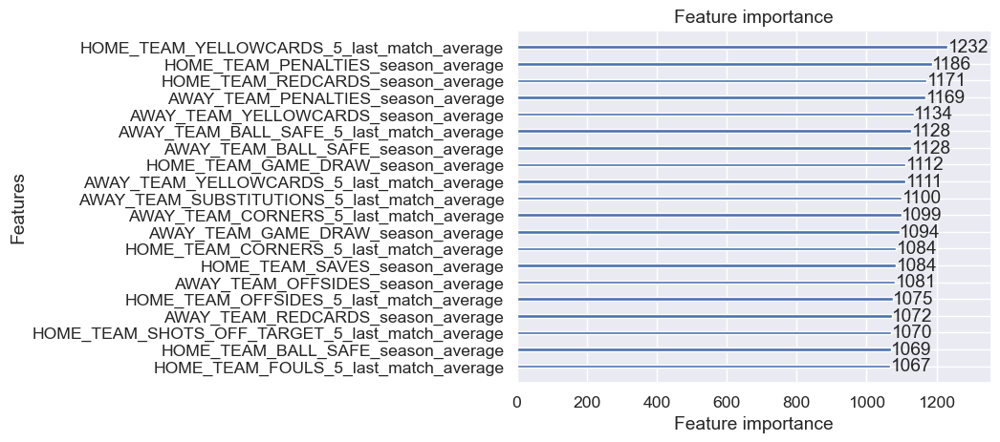

In [166]:
train_data_d = lgb.Dataset(X_train, label=y_train)
val_data = lgb.Dataset(X_val, label=y_val, reference=train_data_d)

params = {
    'objective': 'multiclass',  
    'num_class': 3,  
    'metric': 'multi_logloss',  
    'boosting_type': 'gbdt',  
    'num_leaves': 31, 
    'learning_rate': 0.05,  
    'feature_fraction': 0.9,  
    'bagging_fraction': 0.8,  
    'bagging_freq': 5, 
    'max_depth': -1,  
}

num_round = 1000  
bst = lgb.train(params, train_data_d, num_round, valid_sets=[val_data])

y_pred = bst.predict(X_val, num_iteration=bst.best_iteration)
y_pred_class = [np.argmax(x) for x in y_pred]  

# Accuracy
accuracy = accuracy_score(y_val, y_pred_class)
print(f"Accuracy: {accuracy:.4f}")

# Confusion matrix
cm = confusion_matrix(y_val, y_pred_class)
print("Confusion Matrix:")
print(cm)

# Classification report
print("Classification Report:")
print(classification_report(y_val, y_pred_class))

# Plot feature importance
import matplotlib.pyplot as plt
lgb.plot_importance(bst, importance_type='split', max_num_features=20)
plt.show()


df_cleaned_SKB

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 880
[LightGBM] [Info] Number of data points in the train set: 9842, number of used features: 81
[LightGBM] [Info] Start training from score -0.834343
[LightGBM] [Info] Start training from score -1.344311
[LightGBM] [Info] Start training from score -1.187047
Accuracy: 0.4685
Confusion Matrix:
[[753 120 210]
 [370  81 169]
 [332 107 319]]
Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.70      0.59      1083
           1       0.26      0.13      0.17       620
           2       0.46      0.42      0.44       758

    accuracy                           0.47      2461
   macro avg       0.41      0.42      0.40      2461
weighted avg       0.43      0.47      0.44      2461



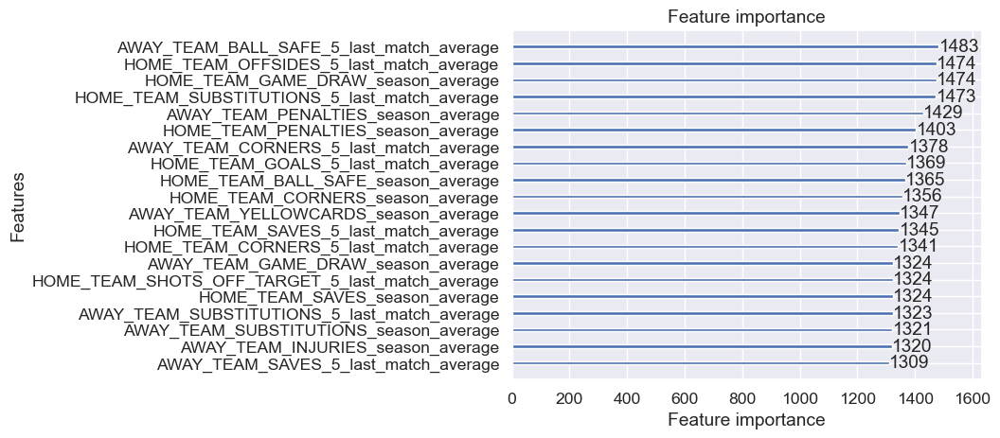

In [168]:
train_data_d = lgb.Dataset(X_train_SKB, label=y_train_SKB)
val_data = lgb.Dataset(X_val_SKB, label=y_val_SKB, reference=train_data_d)

params = {
    'objective': 'multiclass',  
    'num_class': 3,  
    'metric': 'multi_logloss',  
    'boosting_type': 'gbdt',  
    'num_leaves': 31, 
    'learning_rate': 0.05,  
    'feature_fraction': 0.9,  
    'bagging_fraction': 0.8,  
    'bagging_freq': 5, 
    'max_depth': -1,  
}

num_round = 1000  
bst = lgb.train(params, train_data_d, num_round, valid_sets=[val_data])

y_pred = bst.predict(X_val_SKB, num_iteration=bst.best_iteration)
y_pred_class = [np.argmax(x) for x in y_pred]  

# Accuracy
accuracy = accuracy_score(y_val_SKB, y_pred_class)
print(f"Accuracy: {accuracy:.4f}")

# Confusion matrix
cm = confusion_matrix(y_val_SKB, y_pred_class)
print("Confusion Matrix:")
print(cm)

# Classification report
print("Classification Report:")
print(classification_report(y_val_SKB, y_pred_class))

# Plot feature importance
import matplotlib.pyplot as plt
lgb.plot_importance(bst, importance_type='split', max_num_features=20)
plt.show()


df_cleaned_RFE

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 9842, number of used features: 50
[LightGBM] [Info] Start training from score -0.834343
[LightGBM] [Info] Start training from score -1.344311
[LightGBM] [Info] Start training from score -1.187047
Accuracy: 0.4742
Confusion Matrix:
[[759 117 207]
 [347  97 176]
 [337 110 311]]
Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.70      0.60      1083
           1       0.30      0.16      0.21       620
           2       0.45      0.41      0.43       758

    accuracy                           0.47      2461
   macro avg       0.42      0.42      0.41      2461
weighted avg       0.44      0.47      0.45      2461



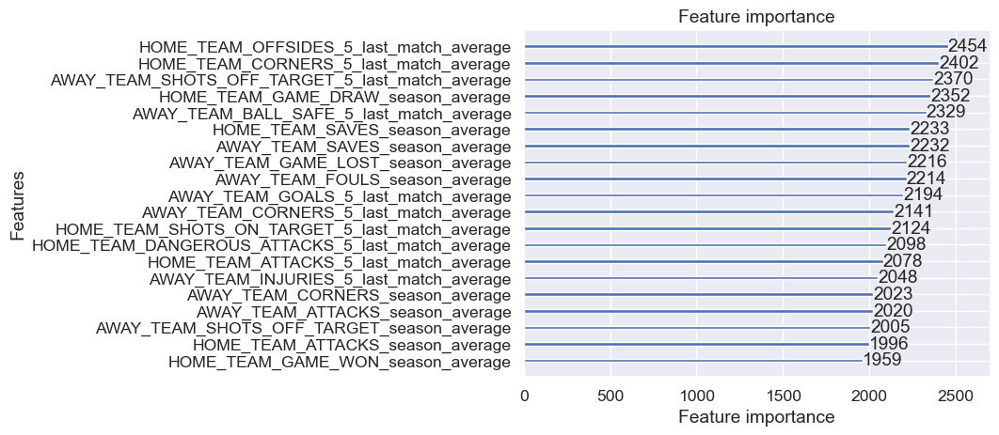

In [170]:
train_data_d = lgb.Dataset(X_train_RFE, label=y_train_RFE)
val_data = lgb.Dataset(X_val_RFE, label=y_val_RFE, reference=train_data_d)

params = {
    'objective': 'multiclass',  
    'num_class': 3,  
    'metric': 'multi_logloss',  
    'boosting_type': 'gbdt',  
    'num_leaves': 31, 
    'learning_rate': 0.05,  
    'feature_fraction': 0.9,  
    'bagging_fraction': 0.8,  
    'bagging_freq': 5, 
    'max_depth': -1,  
}

num_round = 1000  
bst = lgb.train(params, train_data_d, num_round, valid_sets=[val_data])

y_pred = bst.predict(X_val_RFE, num_iteration=bst.best_iteration)
y_pred_class = [np.argmax(x) for x in y_pred]  

# Accuracy
accuracy = accuracy_score(y_val_RFE, y_pred_class)
print(f"Accuracy: {accuracy:.4f}")

# Confusion matrix
cm = confusion_matrix(y_val_RFE, y_pred_class)
print("Confusion Matrix:")
print(cm)

# Classification report
print("Classification Report:")
print(classification_report(y_val_RFE, y_pred_class))

# Plot feature importance
import matplotlib.pyplot as plt
lgb.plot_importance(bst, importance_type='split', max_num_features=20)
plt.show()


df_cleaned_RFFI

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 883
[LightGBM] [Info] Number of data points in the train set: 9842, number of used features: 81
[LightGBM] [Info] Start training from score -0.834343
[LightGBM] [Info] Start training from score -1.344311
[LightGBM] [Info] Start training from score -1.187047
Accuracy: 0.4754
Confusion Matrix:
[[765 116 202]
 [365  78 177]
 [348  83 327]]
Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.71      0.60      1083
           1       0.28      0.13      0.17       620
           2       0.46      0.43      0.45       758

    accuracy                           0.48      2461
   macro avg       0.42      0.42      0.41      2461
weighted avg       0.44      0.48      0.44      2461



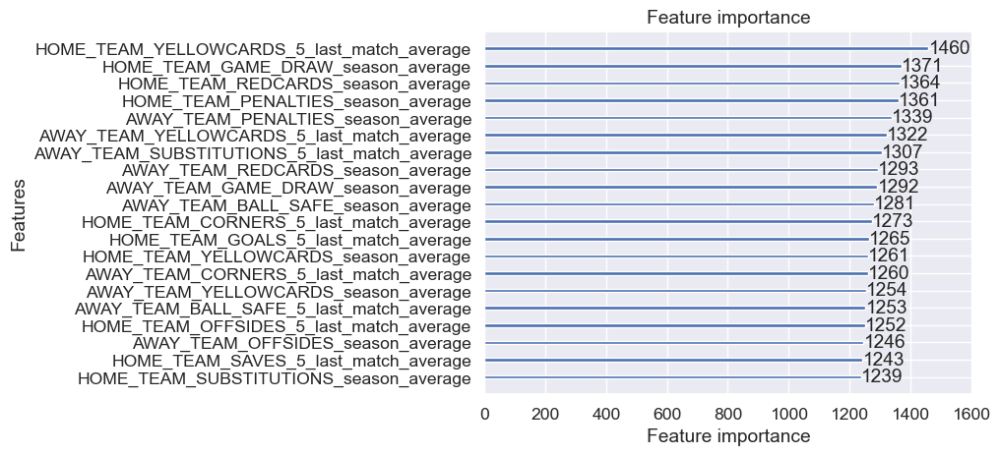

In [171]:
train_data_d = lgb.Dataset(X_train_RFFI, label=y_train_RFFI)
val_data = lgb.Dataset(X_val_RFFI, label=y_val_RFFI, reference=train_data_d)

params = {
    'objective': 'multiclass',  
    'num_class': 3,  
    'metric': 'multi_logloss',  
    'boosting_type': 'gbdt',  
    'num_leaves': 31, 
    'learning_rate': 0.05,  
    'feature_fraction': 0.9,  
    'bagging_fraction': 0.8,  
    'bagging_freq': 5, 
    'max_depth': -1,  
}

num_round = 1000  
bst = lgb.train(params, train_data_d, num_round, valid_sets=[val_data])

y_pred = bst.predict(X_val_RFFI, num_iteration=bst.best_iteration)
y_pred_class = [np.argmax(x) for x in y_pred]  

# Accuracy
accuracy = accuracy_score(y_val_RFFI, y_pred_class)
print(f"Accuracy: {accuracy:.4f}")

# Confusion matrix
cm = confusion_matrix(y_val_RFFI, y_pred_class)
print("Confusion Matrix:")
print(cm)

# Classification report
print("Classification Report:")
print(classification_report(y_val_RFFI, y_pred_class))

# Plot feature importance
import matplotlib.pyplot as plt
lgb.plot_importance(bst, importance_type='split', max_num_features=20)
plt.show()


**with hyperparameter tuning GRIDSEARCH using train data**

In [174]:
param_grid_lgbm = {
    'learning_rate': [0.01, 0.02, 0.05, 0.1],
    'n_estimators': [100, 200, 300],
    'num_leaves': [20, 40, 60],
    'max_depth': [-1, 10, 20],
    'min_child_samples': [5, 10, 20]
}
lgbm = LGBMClassifier(random_state=42)
grid_search = GridSearchCV(lgbm, param_grid_lgbm, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

print(f"Best parameters: {grid_search.best_params_}")


Fitting 3 folds for each of 324 candidates, totalling 972 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1082
[LightGBM] [Info] Number of data points in the train set: 9842, number of used features: 100
[LightGBM] [Info] Start training from score -0.834343
[LightGBM] [Info] Start training from score -1.344311
[LightGBM] [Info] Start training from score -1.187047
Best parameters: {'learning_rate': 0.02, 'max_depth': 10, 'min_child_samples': 5, 'n_estimators': 100, 'num_leaves': 20}


In [176]:
lgbm_clf = LGBMClassifier(learning_rate=0.02, max_depth=10, min_child_samples=5, n_estimators=100, num_leaves=20)
lgbm_clf.fit(X_train, y_train)

y_pred_lgbm = lgbm_clf.predict(X_val)

print("LGBM Classifier Performance:")
print(f"Accuracy: {accuracy_score(y_val, y_pred_lgbm):.4f}")
print("Classification Report:")
print(classification_report(y_val, y_pred_lgbm))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1082
[LightGBM] [Info] Number of data points in the train set: 9842, number of used features: 100
[LightGBM] [Info] Start training from score -0.834343
[LightGBM] [Info] Start training from score -1.344311
[LightGBM] [Info] Start training from score -1.187047
LGBM Classifier Performance:
Accuracy: 0.4998
Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.84      0.63      1083
           1       0.67      0.01      0.01       620
           2       0.49      0.41      0.45       758

    accuracy                           0.50      2461
   macro avg       0.55      0.42      0.36      2461
weighted avg       0.54      0.50      0.42      2461



**with hyperparameter tuning and dataset adapted using selectKbest**


In [177]:
grid_search.fit(X_train_SKB, y_train_SKB)

Fitting 3 folds for each of 324 candidates, totalling 972 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 880
[LightGBM] [Info] Number of data points in the train set: 9842, number of used features: 81
[LightGBM] [Info] Start training from score -0.834343
[LightGBM] [Info] Start training from score -1.344311
[LightGBM] [Info] Start training from score -1.187047


GridSearchCV(cv=3, estimator=LGBMClassifier(random_state=42), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.02, 0.05, 0.1],
                         'max_depth': [-1, 10, 20],
                         'min_child_samples': [5, 10, 20],
                         'n_estimators': [100, 200, 300],
                         'num_leaves': [20, 40, 60]},
             verbose=2)

In [178]:
print(f"Best parameters: {grid_search.best_params_}")

Best parameters: {'learning_rate': 0.02, 'max_depth': 10, 'min_child_samples': 5, 'n_estimators': 100, 'num_leaves': 20}


In [221]:
lgbm_clf1 = LGBMClassifier(learning_rate=0.02, max_depth=10, min_child_samples=5, n_estimators=100, num_leaves=20)
lgbm_clf1.fit(X_train_SKB, y_train_SKB)

y_pred_lgbm = lgbm_clf1.predict(X_val_SKB)

print("LGBM Classifier Performance:")
print(f"Accuracy: {accuracy_score(y_val_SKB, y_pred_lgbm):.4f}")
print("Classification Report:")
print(classification_report(y_val_SKB, y_pred_lgbm))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 880
[LightGBM] [Info] Number of data points in the train set: 9842, number of used features: 81
[LightGBM] [Info] Start training from score -0.834343
[LightGBM] [Info] Start training from score -1.344311
[LightGBM] [Info] Start training from score -1.187047
LGBM Classifier Performance:
Accuracy: 0.5026
Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.84      0.63      1083
           1       0.62      0.01      0.02       620
           2       0.49      0.42      0.46       758

    accuracy                           0.50      2461
   macro avg       0.54      0.42      0.37      2461
weighted avg       0.53      0.50      0.42      2461



**with hyperparameter tuning and dataset adapted using RFE**

In [181]:
lgbm_clf = LGBMClassifier(learning_rate=0.02, max_depth=10, min_child_samples=5, n_estimators=100, num_leaves=20)
lgbm_clf.fit(X_train_RFE, y_train_RFE)

y_pred_lgbm = lgbm_clf.predict(X_val_RFE)

print("LGBM Classifier Performance:")
print(f"Accuracy: {accuracy_score(y_val_RFE, y_pred_lgbm):.4f}")
print("Classification Report:")
print(classification_report(y_val_RFE, y_pred_lgbm))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 9842, number of used features: 50
[LightGBM] [Info] Start training from score -0.834343
[LightGBM] [Info] Start training from score -1.344311
[LightGBM] [Info] Start training from score -1.187047
LGBM Classifier Performance:
Accuracy: 0.4986
Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.84      0.63      1083
           1       0.31      0.01      0.02       620
           2       0.49      0.41      0.45       758

    accuracy                           0.50      2461
   macro avg       0.44      0.42      0.36      2461
weighted avg       0.45      0.50      0.42      2461



**with hyperparameter tuning and dataset adapted using RFFI**

In [182]:
lgbm_clf = LGBMClassifier(learning_rate=0.02, max_depth=10, min_child_samples=5, n_estimators=100, num_leaves=20)
lgbm_clf.fit(X_train_RFFI, y_train_RFFI)

y_pred_lgbm = lgbm_clf.predict(X_val_RFFI)

print("LGBM Classifier Performance:")
print(f"Accuracy: {accuracy_score(y_val_RFFI, y_pred_lgbm):.4f}")
print("Classification Report:")
print(classification_report(y_val_RFFI, y_pred_lgbm))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 883
[LightGBM] [Info] Number of data points in the train set: 9842, number of used features: 81
[LightGBM] [Info] Start training from score -0.834343
[LightGBM] [Info] Start training from score -1.344311
[LightGBM] [Info] Start training from score -1.187047
LGBM Classifier Performance:
Accuracy: 0.4961
Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.84      0.63      1083
           1       0.20      0.00      0.00       620
           2       0.50      0.41      0.45       758

    accuracy                           0.50      2461
   macro avg       0.40      0.42      0.36      2461
weighted avg       0.42      0.50      0.41      2461



=> we can observe that applying the model **LGBM** with hyperparameter tuning and dataset adapted using **selectKbest** leads to the best accuracy : **0.5026**

In [254]:
import lightgbm as lgb
import pandas as pd

X_test_lgb = lgb.Dataset(test_data_SKB)

predictions = lgbm_clf1.predict_proba(test_data_SKB)

predictions = pd.DataFrame(predictions)

if predictions.shape[1] == 2:  
    predictions[2] = 0

predictions.columns = [0, 2, 1]
predictions = predictions.reindex(columns=[0, 1, 2])

predictions = (predictions.rank(axis=1, ascending=False) == 1).astype(int)

predictions.columns = ['HOME_WINS', 'DRAW', 'AWAY_WINS']

predictions.index = test_data_SKB.index

submission = predictions.reset_index()

submission.to_csv('benchmark_submission_SKB_LGBM.csv', index=False)

print("Submission file saved as 'benchmark_submission_SKB_LGBM.csv'")


Submission file saved as 'benchmark_submission_SKB_LGBM.csv'


### <font color='MediumOrchid'> Stochastic Gradient Descent Classifier

For this model, we are going to perform **feature scaling** given that SGD classifier relies on gradient descent optimization, which is sensitive to the scale of input features

**without hyperparameter tuning using train data**

Accuracy: 0.4673
Confusion Matrix:
[[722 144 217]
 [340  88 192]
 [338  80 340]]
Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.67      0.58      1083
           1       0.28      0.14      0.19       620
           2       0.45      0.45      0.45       758

    accuracy                           0.47      2461
   macro avg       0.42      0.42      0.41      2461
weighted avg       0.44      0.47      0.44      2461



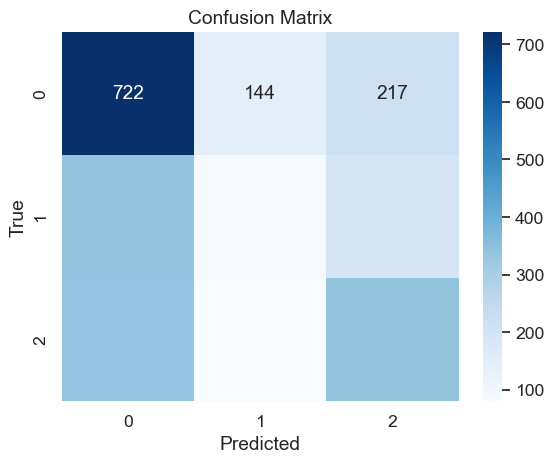

In [230]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

sgd = SGDClassifier(loss='log', 
                    max_iter=1000, 
                    tol=1e-3,  
                    random_state=42)

sgd.fit(X_train_scaled, y_train)
y_pred = sgd.predict(X_val_scaled)

# Accuracy
accuracy = accuracy_score(y_val, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Confusion matrix
cm = confusion_matrix(y_val, y_pred)
print("Confusion Matrix:")
print(cm)

# Classification report
print("Classification Report:")
print(classification_report(y_val, y_pred))

# Plot the confusion matrix
import matplotlib.pyplot as plt
import seaborn as sns

sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2], yticklabels=[0, 1, 2])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


**with hyperparameter tuning GRIDSEARCH**

In [231]:
param_grid_sgd = {
    'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge'],
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'max_iter': [1000, 2000, 5000],
    'learning_rate': ['optimal', 'constant', 'invscaling', 'adaptive']
}

grid_search2 = GridSearchCV(
    SGDClassifier(), 
    param_grid_sgd, 
    cv=3, 
    n_jobs=-1, 
    verbose=2
)
grid_search2.fit(X_train_scaled, y_train)

print(f"Best parameters: {grid_search2.best_params_}")


Fitting 3 folds for each of 192 candidates, totalling 576 fits
Best parameters: {'alpha': 0.1, 'learning_rate': 'optimal', 'loss': 'log', 'max_iter': 1000}


In [232]:
sgd_clf = SGDClassifier(loss='log', learning_rate='optimal', alpha=0.1, max_iter=1000)
sgd_clf.fit(X_train_scaled, y_train)

y_pred_sgd = sgd_clf.predict(X_val_scaled)

# Evaluate the model
print("SGD Classifier Performance:")
print(f"Accuracy: {accuracy_score(y_val, y_pred_sgd):.4f}")
print("Classification Report:")
print(classification_report(y_val, y_pred_sgd))


SGD Classifier Performance:
Accuracy: 0.4957
Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.80      0.62      1083
           1       0.17      0.00      0.01       620
           2       0.47      0.46      0.47       758

    accuracy                           0.50      2461
   macro avg       0.38      0.42      0.37      2461
weighted avg       0.41      0.50      0.42      2461



**with hyperparameter tuning and dataset adapted using selectKbest**

In [233]:
scaler = StandardScaler()
X_train_SKB_scaled = scaler.fit_transform(X_train_SKB)
X_val_SKB_scaled = scaler.transform(X_val_SKB)

sgd_clf = SGDClassifier(loss='log', learning_rate='optimal', alpha=0.1, max_iter=1000)
sgd_clf.fit(X_train_SKB_scaled, y_train_SKB)

y_pred_sgd = sgd_clf.predict(X_val_SKB_scaled)

# Evaluate the model
print("SGD Classifier Performance:")
print(f"Accuracy: {accuracy_score(y_val_SKB, y_pred_sgd):.4f}")
print("Classification Report:")
print(classification_report(y_val_SKB, y_pred_sgd))

SGD Classifier Performance:
Accuracy: 0.4965
Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.80      0.62      1083
           1       0.00      0.00      0.00       620
           2       0.47      0.46      0.47       758

    accuracy                           0.50      2461
   macro avg       0.33      0.42      0.36      2461
weighted avg       0.37      0.50      0.42      2461



**with hyperparameter tuning and dataset adapted using RFE**

In [239]:
scaler = StandardScaler()
X_train_RFE_scaled = scaler.fit_transform(X_train_RFE)
X_val_RFE_scaled = scaler.transform(X_val_RFE)

sgd_clf1 = SGDClassifier(loss='log', learning_rate='optimal', alpha=0.1, max_iter=2000)
sgd_clf1.fit(X_train_RFE_scaled, y_train_RFE)
y_pred_sgd = sgd_clf1.predict(X_val_RFE_scaled)

print("SGD Classifier Performance:")
print(f"Accuracy: {accuracy_score(y_val_RFE, y_pred_sgd):.4f}")
print("Classification Report:")
print(classification_report(y_val_RFE, y_pred_sgd))

SGD Classifier Performance:
Accuracy: 0.5035
Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.82      0.63      1083
           1       1.00      0.00      0.00       620
           2       0.49      0.46      0.47       758

    accuracy                           0.50      2461
   macro avg       0.67      0.43      0.37      2461
weighted avg       0.63      0.50      0.42      2461



**with hyperparameter tuning and dataset adapted using RFFI**

In [235]:
scaler = StandardScaler()
X_train_RFFI_scaled = scaler.fit_transform(X_train_RFFI)
X_val_RFFI_scaled = scaler.transform(X_val_RFFI)

sgd_clf = SGDClassifier(loss='log', learning_rate='optimal', alpha=0.1, max_iter=2000)
sgd_clf.fit(X_train_RFFI_scaled, y_train_RFFI)
y_pred_sgd = sgd_clf.predict(X_val_RFFI_scaled)

print("SGD Classifier Performance:")
print(f"Accuracy: {accuracy_score(y_val_RFFI, y_pred_sgd):.4f}")
print("Classification Report:")
print(classification_report(y_val_RFFI, y_pred_sgd))

SGD Classifier Performance:
Accuracy: 0.4998
Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.81      0.62      1083
           1       0.50      0.00      0.01       620
           2       0.48      0.46      0.47       758

    accuracy                           0.50      2461
   macro avg       0.50      0.43      0.37      2461
weighted avg       0.50      0.50      0.42      2461



=> we can observe that applying the model **Stochastic Gradient Descent Classifier** with hyperparameter tuning and dataset adapted using **RFE** leads to the best accuracy : **0.5035**

In [252]:
y_pred_prob = sgd_clf1.predict_proba(test_data_RFE)  

predictions = pd.DataFrame(y_pred_prob)

predictions.columns = [0, 2, 1]
predictions = predictions.reindex(columns=[0, 1, 2])
predictions = (predictions.rank(axis=1, ascending=False) == 1).astype(int)
predictions.columns = ['HOME_WINS', 'DRAW', 'AWAY_WINS']
predictions.index = test_data.index

submission = predictions.reset_index()

submission.to_csv('benchmark_submission_SGD_RFE.csv', index=False)

print("Submission file saved as 'benchmark_submission_SGD_RFE.csv'")


Submission file saved as 'benchmark_submission_SGD_RFE.csv'


### <font color='MediumOrchid'> XGBoost 

**without hyperparameter tuning**

In [191]:
import xgboost as xgb
from sklearn.metrics import accuracy_score

xgb_model = xgb.XGBClassifier(
    n_estimators=100,               
    learning_rate=0.1,              
    max_depth=5,                    
    subsample=0.8,                 
    colsample_bytree=0.8,          
    gamma=0,                        
    reg_alpha=0,                   
    reg_lambda=1,                  
    scale_pos_weight=1,             
    use_label_encoder=False,       
    eval_metric='logloss'          
)

xgb_model.fit(X_train, y_train)

# Evaluate the model on the validation set
y_val_pred = xgb_model.predict(X_val)
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
y_test_pred = xgb_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')


Validation Accuracy: 48.27%
Test Accuracy: 48.27%


**with hyperparameter tuning GRIDSEARCH**
    

In [198]:
base_params = {
    'booster': 'gbtree',
    'tree_method': 'hist',
    'objective': 'multi:softprob',  
    'eval_metric': 'mlogloss',
    'num_class': 3  
}
d_train = xgb.DMatrix(X_train, label=y_train)
d_valid = xgb.DMatrix(X_val, label=y_val)

param_grid = {
    'max_depth': [6, 8, 10],
    'learning_rate': [0.01, 0.025, 0.05],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'min_child_weight': [1, 3, 5]
}

cv_folds = 5
stratified_kfold = StratifiedKFold(n_splits=cv_folds, shuffle=True, random_state=42)

xgb_model = xgb.XGBClassifier(
    objective='multi:softprob',
    eval_metric='mlogloss',
    num_class=3,
    tree_method='hist',
    use_label_encoder=False
)

grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='accuracy',
    cv=stratified_kfold,
    verbose=1,
    n_jobs=-1,

)

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print(f"Best Hyperparameters: {best_params}")

base_params.update(best_params)

num_round = 10000
evallist = [(d_train, 'train'), (d_valid, 'eval')]

bst = xgb.train(
    params=base_params,
    dtrain=d_train,
    num_boost_round=num_round,
    evals=evallist,
    early_stopping_rounds=100,
    verbose_eval=100
)

# Predict on validation set
y_pred_proba = bst.predict(d_valid)
y_pred = np.argmax(y_pred_proba, axis=1)

# Evaluate accuracy
accuracy = accuracy_score(y_val, y_pred)
print(f"Final Model Accuracy on Validation Set: {accuracy:.2f}")

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best Hyperparameters: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 8, 'min_child_weight': 3, 'subsample': 0.7}
[0]	train-mlogloss:1.09591	eval-mlogloss:1.09750
[100]	train-mlogloss:0.90714	eval-mlogloss:1.03661
[200]	train-mlogloss:0.79101	eval-mlogloss:1.02221
[300]	train-mlogloss:0.70347	eval-mlogloss:1.02027
[386]	train-mlogloss:0.63933	eval-mlogloss:1.02111
Final Model Accuracy on Validation Set: 0.50


**with hyperparameter tuning and dataset adapted using selectKbest**
    

In [200]:
d_train_SKB = xgb.DMatrix(X_train_SKB, label=y_train_SKB)
d_valid_SKB = xgb.DMatrix(X_val_SKB, label=y_val_SKB)

num_round = 10000
evallist = [(d_train_SKB, 'train'), (d_valid_SKB, 'eval')]

bst = xgb.train(
    params=base_params,
    dtrain=d_train_SKB,
    num_boost_round=num_round,
    evals=evallist,
    early_stopping_rounds=100,
    verbose_eval=100
)

# Predict on validation set
y_pred_proba = bst.predict(d_valid_SKB)
y_pred = np.argmax(y_pred_proba, axis=1)

# Evaluate accuracy
accuracy = accuracy_score(y_val_SKB, y_pred)
print(f"Final Model Accuracy on Validation Set: {accuracy:.2f}")

[0]	train-mlogloss:1.09609	eval-mlogloss:1.09738
[100]	train-mlogloss:0.91369	eval-mlogloss:1.03703
[200]	train-mlogloss:0.80173	eval-mlogloss:1.02220
[300]	train-mlogloss:0.71755	eval-mlogloss:1.01972
[400]	train-mlogloss:0.64559	eval-mlogloss:1.02116
[424]	train-mlogloss:0.63058	eval-mlogloss:1.02145
Final Model Accuracy on Validation Set: 0.49


**with hyperparameter tuning and dataset adapted using RFE**
    

In [201]:
d_train_RFE = xgb.DMatrix(X_train_RFE, label=y_train_RFE)
d_valid_RFE = xgb.DMatrix(X_val_RFE, label=y_val_RFE)

num_round = 10000
evallist = [(d_train_RFE, 'train'), (d_valid_RFE, 'eval')]

bst = xgb.train(
    params=base_params,
    dtrain=d_train_RFE,
    num_boost_round=num_round,
    evals=evallist,
    early_stopping_rounds=100,
    verbose_eval=100
)

# Predict on validation set
y_pred_proba = bst.predict(d_valid_RFE)
y_pred = np.argmax(y_pred_proba, axis=1)

# Evaluate accuracy
accuracy = accuracy_score(y_val_RFE, y_pred)
print(f"Final Model Accuracy on Validation Set: {accuracy:.2f}")

[0]	train-mlogloss:1.09605	eval-mlogloss:1.09753
[100]	train-mlogloss:0.92804	eval-mlogloss:1.03400
[200]	train-mlogloss:0.82836	eval-mlogloss:1.01914
[300]	train-mlogloss:0.75248	eval-mlogloss:1.01629
[400]	train-mlogloss:0.68896	eval-mlogloss:1.01582
[465]	train-mlogloss:0.65180	eval-mlogloss:1.01708
Final Model Accuracy on Validation Set: 0.50


**with hyperparameter tuning and dataset adapted using RFFI**

In [202]:
d_train_RFFI = xgb.DMatrix(X_train_RFFI, label=y_train_RFFI)
d_valid_RFFI = xgb.DMatrix(X_val_RFFI, label=y_val_RFFI)

num_round = 10000
evallist = [(d_train_RFFI, 'train'), (d_valid_RFFI, 'eval')]

bst = xgb.train(
    params=base_params,
    dtrain=d_train_RFFI,
    num_boost_round=num_round,
    evals=evallist,
    early_stopping_rounds=100,
    verbose_eval=100
)

# Predict on validation set
y_pred_proba = bst.predict(d_valid_RFFI)
y_pred = np.argmax(y_pred_proba, axis=1)

# Evaluate accuracy
accuracy = accuracy_score(y_val_RFFI, y_pred)
print(f"Final Model Accuracy on Validation Set: {accuracy:.2f}")

[0]	train-mlogloss:1.09599	eval-mlogloss:1.09741
[100]	train-mlogloss:0.91171	eval-mlogloss:1.03592
[200]	train-mlogloss:0.79858	eval-mlogloss:1.02149
[300]	train-mlogloss:0.71069	eval-mlogloss:1.01984
[400]	train-mlogloss:0.63817	eval-mlogloss:1.02119
[432]	train-mlogloss:0.61748	eval-mlogloss:1.02161
Final Model Accuracy on Validation Set: 0.50


=> we can observe that the hyperparameter tuning using **gridsearch** improved the accuracy of the **XGBoost model**  
we can also conclude that the performance of the model applied using train_data, RFE and RFFI data return the same accuracy : **0.5**

### <font color='MediumOrchid'> Random Forest 

 **without hyperparameter tuning**




In [249]:
model = RandomForestClassifier()
rf_params = {
    'n_estimators': 100,  
    'criterion': 'gini', 
    'max_depth': 8, 
    'min_samples_split': 2,  
    'min_samples_leaf': 1,  
    'random_state': 42,  
    'n_jobs': -1
}

random_forest = RandomForestClassifier(**rf_params)

random_forest.fit(X_train, y_train)

# Evaluate on validation data
y_pred = random_forest.predict(X_val)
accuracy = accuracy_score(y_val, y_pred)
print(f"Random Forest Accuracy on Validation Set: {accuracy:.2f}")


Random Forest Accuracy on Validation Set: 0.50


In [251]:
y_pred_prob = random_forest.predict_proba(test_data)  

predictions = pd.DataFrame(y_pred_prob)

predictions.columns = [0, 2, 1]
predictions = predictions.reindex(columns=[0, 1, 2])
predictions = (predictions.rank(axis=1, ascending=False) == 1).astype(int)
predictions.columns = ['HOME_WINS', 'DRAW', 'AWAY_WINS']
predictions.index = test_data.index

submission = predictions.reset_index()

submission.to_csv('benchmark_submission_Random_forest.csv', index=False)

print("Submission file saved as 'benchmark_submission_Random_forest.csv'")


Submission file saved as 'benchmark_submission_Random_forest.csv'


**with hyperparameter tuning GRIDSEARCH**
   

In [205]:
param_grid = {
    'n_estimators': [100, 200, 300],         
    'criterion': ['gini', 'entropy'],       
    'max_depth': [5, 8, 10, 15],            
    'min_samples_split': [2, 5, 10],       
    'min_samples_leaf': [1, 2, 5],          
    'max_features': ['sqrt', 'log2', None] 
}

random_forest = RandomForestClassifier(random_state=42, n_jobs=-1)

grid_search = GridSearchCV(estimator=random_forest, 
                           param_grid=param_grid, 
                           scoring='accuracy', 
                           cv=3,          
                           verbose=1,     
                           n_jobs=-1)     

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print(f"Best Hyperparameters: {best_params}")

# Evaluate the best model on the validation set
best_model = grid_search.best_estimator_
y_val_pred = best_model.predict(X_val)
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy with Best Parameters: {val_accuracy * 100:.2f}%")

# Evaluate the model on the test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy with Best Parameters: {test_accuracy * 100:.2f}%")


Fitting 3 folds for each of 648 candidates, totalling 1944 fits
Best Hyperparameters: {'criterion': 'gini', 'max_depth': 10, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}
Validation Accuracy with Best Parameters: 49.33%
Test Accuracy with Best Parameters: 49.33%


 **with hyperparameter tuning and dataset adapted using RFFI**

In [208]:
grid_search.fit(X_train_RFFI, y_train_RFFI)

best_params = grid_search.best_params_
print(f"Best Hyperparameters: {best_params}")

# Evaluate the best model on the validation set
best_model = grid_search.best_estimator_
y_val_pred = best_model.predict(X_val_RFFI)
val_accuracy = accuracy_score(y_val_RFFI, y_val_pred)
print(f"Validation Accuracy with Best Parameters: {val_accuracy * 100:.2f}%")

# Evaluate the model on the test set
y_test_pred = best_model.predict(X_test_RFFI)
test_accuracy = accuracy_score(y_test_RFFI, y_test_pred)
print(f"Test Accuracy with Best Parameters: {test_accuracy * 100:.2f}%")

Fitting 3 folds for each of 648 candidates, totalling 1944 fits
Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 15, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}
Validation Accuracy with Best Parameters: 49.29%
Test Accuracy with Best Parameters: 49.29%


=> we can observe that the model **Random Forest** applied without hyperparameter tuning provides the best accuracy : **0.5**

### <font color='MediumOrchid'> Decision Tree 

**without hyperparameter tuning**
   

In [211]:
dt_params = {
    'criterion': 'gini',  
    'max_depth': 8, 
    'min_samples_split': 2,  
    'min_samples_leaf': 1, 
    'random_state': 42  
}

decision_tree = DecisionTreeClassifier(**dt_params)

decision_tree.fit(X_train, y_train)

y_pred = decision_tree.predict(X_val)
accuracy = accuracy_score(y_val, y_pred)
print(f"Decision Tree Accuracy on Validation Set: {accuracy:.2f}")


Decision Tree Accuracy on Validation Set: 0.46


 **with hyperparameter tuning GRIDSEARCH**
    


In [212]:
param_grid = {
    'criterion': ['gini', 'entropy'], 
    'max_depth': [5, 8, 10, 15],     
    'min_samples_split': [2, 5, 10], 
    'min_samples_leaf': [1, 2, 5],  
}

decision_tree = DecisionTreeClassifier(random_state=42)

grid_search = GridSearchCV(estimator=decision_tree, 
                           param_grid=param_grid, 
                           scoring='accuracy', 
                           cv=3,           
                           verbose=1,      
                           n_jobs=-1)     

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print(f"Best Hyperparameters: {best_params}")

# Evaluate the best model on the validation set
best_model = grid_search.best_estimator_
y_val_pred = best_model.predict(X_val)
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy with Best Parameters: {val_accuracy * 100:.2f}%")

# Evaluate the model on the test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy with Best Parameters: {test_accuracy * 100:.2f}%")


Fitting 3 folds for each of 72 candidates, totalling 216 fits
Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Validation Accuracy with Best Parameters: 47.42%
Test Accuracy with Best Parameters: 47.42%


**with hyperparameter tuning and dataset adapted using selectKbest**
  

In [216]:
grid_search.fit(X_train_SKB, y_train_SKB)

best_params = grid_search.best_params_
print(f"Best Hyperparameters: {best_params}")

# Evaluate the best model on the validation set
best_model = grid_search.best_estimator_

y_val_pred = best_model.predict(X_val_SKB)
val_accuracy = accuracy_score(y_val_SKB, y_val_pred)
print(f"Validation Accuracy with Best Parameters: {val_accuracy * 100:.2f}%")

# Evaluate the model on the test set
y_test_pred = best_model.predict(X_test_SKB)
test_accuracy = accuracy_score(y_test_SKB, y_test_pred)
print(f"Test Accuracy with Best Parameters: {test_accuracy * 100:.2f}%")

Fitting 3 folds for each of 72 candidates, totalling 216 fits
Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Validation Accuracy with Best Parameters: 47.42%
Test Accuracy with Best Parameters: 47.42%


  **with hyperparameter tuning and dataset adapted using RFE**
   

In [217]:
grid_search.fit(X_train_RFE, y_train_RFE)

best_params = grid_search.best_params_
print(f"Best Hyperparameters: {best_params}")

# Evaluate the best model on the validation set
best_model = grid_search.best_estimator_
y_val_pred = best_model.predict(X_val_RFE)
val_accuracy = accuracy_score(y_val_RFE, y_val_pred)
print(f"Validation Accuracy with Best Parameters: {val_accuracy * 100:.2f}%")

# Evaluate the model on the test set
y_test_pred = best_model.predict(X_test_RFE)
test_accuracy = accuracy_score(y_test_RFE, y_test_pred)
print(f"Test Accuracy with Best Parameters: {test_accuracy * 100:.2f}%")

Fitting 3 folds for each of 72 candidates, totalling 216 fits
Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Validation Accuracy with Best Parameters: 47.50%
Test Accuracy with Best Parameters: 47.50%


 **with hyperparameter tuning and dataset adapted using RFFI**

In [218]:
grid_search.fit(X_train_RFFI, y_train_RFFI)

best_params = grid_search.best_params_
print(f"Best Hyperparameters: {best_params}")

# Evaluate the best model on the validation set
best_model = grid_search.best_estimator_
y_val_pred = best_model.predict(X_val_RFFI)
val_accuracy = accuracy_score(y_val_RFFI, y_val_pred)
print(f"Validation Accuracy with Best Parameters: {val_accuracy * 100:.2f}%")

# Evaluate the model on the test set
y_test_pred = best_model.predict(X_test_RFFI)
test_accuracy = accuracy_score(y_test_RFFI, y_test_pred)
print(f"Test Accuracy with Best Parameters: {test_accuracy * 100:.2f}%")

Fitting 3 folds for each of 72 candidates, totalling 216 fits
Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Validation Accuracy with Best Parameters: 47.87%
Test Accuracy with Best Parameters: 47.87%


=> we can observe that applying the model **Decision Tree** with hyperparameter tuning and using the dataset **RFFI** provides the best accuracy : **47.87%**  

However, Decision Tree's results show that it is less performant than other models

## <font color=' MidnightBlue'> Final chosen solution

After submitting our solutions on the Challenge Data Platform, and comparing the different accuracies provided by all of the five models we produced, we concluded that the model **XGBoost** was the most performant one in predicting the results of football games with an accuracy of : **0.4711**